# Build a Conditional GAN

### Goals
In this notebook, you're going to make a conditional GAN in order to generate hand-written images of digits, conditioned on the digit to be generated (the class vector). This will let you choose what digit you want to generate.

You'll then do some exploration of the generated images to visualize what the noise and class vectors mean.  

### Learning Objectives
1.   Learn the technical difference between a conditional and unconditional GAN.
2.   Understand the distinction between the class and noise vector in a conditional GAN.



## Getting Started

For this assignment, you will be using the MNIST dataset again, but there's nothing stopping you from applying this generator code to produce images of animals conditioned on the species or pictures of faces conditioned on facial characteristics.

Note that this assignment requires no changes to the architectures of the generator or discriminator, only changes to the data passed to both. The generator will no longer take `z_dim` as an argument, but  `input_dim` instead, since you need to pass in both the noise and class vectors. In addition to good variable naming, this also means that you can use the generator and discriminator code you have previously written with different parameters.

You will begin by importing the necessary libraries and building the generator and discriminator.

#### Packages and Visualization

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for our testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), nrow=5, show=True):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show:
        plt.show()

#### Generator and Noise

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        input_dim: the dimension of the input vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, input_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.input_dim = input_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(input_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, input_dim)
        '''
        x = noise.view(len(noise), self.input_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, input_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, input_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        input_dim: the dimension of the input vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, input_dim, device=device)

#### Discriminator

In [3]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
      im_chan: the number of channels in the images, fitted for the dataset used, a scalar
            (MNIST is black-and-white, so 1 channel is your default)
      hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of the DCGAN; 
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

## Class Input

In conditional GANs, the input vector for the generator will also need to include the class information. The class is represented using a one-hot encoded vector where its length is the number of classes and each index represents a class. The vector is all 0's and a 1 on the chosen class. Given the labels of multiple images (e.g. from a batch) and number of classes, please create one-hot vectors for each label. There is a class within the PyTorch functional library that can help you.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">get_one_hot_labels</font></code></b>
</font>
</summary>

1.   This code can be done in one line.
2.   The documentation for [F.one_hot](https://pytorch.org/docs/stable/nn.functional.html#torch.nn.functional.one_hot) may be helpful.

</details>


In [4]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_one_hot_labels

import torch.nn.functional as F
def get_one_hot_labels(labels, n_classes):
    '''
    Function for creating one-hot vectors for the labels, returns a tensor of shape (?, num_classes).
    Parameters:
        labels: tensor of labels from the dataloader, size (?)
        n_classes: the total number of classes in the dataset, an integer scalar
    '''
    #### START CODE HERE ####
    return F.one_hot(labels, n_classes)
    #### END CODE HERE ####

In [5]:
assert (
    get_one_hot_labels(
        labels=torch.Tensor([[0, 2, 1]]).long(),
        n_classes=3
    ).tolist() == 
    [[
      [1, 0, 0], 
      [0, 0, 1], 
      [0, 1, 0]
    ]]
)
print("Success!")

Success!


Next, you need to be able to concatenate the one-hot class vector to the noise vector before giving it to the generator. You will also need to do this when adding the class channels to the discriminator.

To do this, you will need to write a function that combines two vectors. Remember that you need to ensure that the vectors are the same type: floats. Again, you can look to the PyTorch library for help.
<details>
<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">combine_vectors</font></code></b>
</font>
</summary>

1.   This code can also be written in one line.
2.   The documentation for [torch.cat](https://pytorch.org/docs/master/generated/torch.cat.html) may be helpful.
3.   Specifically, you might want to look at what the `dim` argument of `torch.cat` does.

</details>


In [6]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: combine_vectors
def combine_vectors(x, y):
    '''
    Function for combining two vectors with shapes (n_samples, ?) and (n_samples, ?).
    Parameters:
      x: (n_samples, ?) the first vector. 
        In this assignment, this will be the noise vector of shape (n_samples, z_dim), 
        but you shouldn't need to know the second dimension's size.
      y: (n_samples, ?) the second vector.
        Once again, in this assignment this will be the one-hot class vector 
        with the shape (n_samples, n_classes), but you shouldn't assume this in your code.
    '''
    # Note: Make sure this function outputs a float no matter what inputs it receives
    #### START CODE HERE ####
    combined = torch.cat((x.float(), y.float()), 1)
    #### END CODE HERE ####
    return combined

In [7]:
combined = combine_vectors(torch.tensor([[1, 2], [3, 4]]), torch.tensor([[5, 6], [7, 8]]));
# Check exact order of elements
assert torch.all(combined == torch.tensor([[1, 2, 5, 6], [3, 4, 7, 8]]))
# Tests that items are of float type
assert (type(combined[0][0].item()) == float)
# Check shapes
combined = combine_vectors(torch.randn(1, 4, 5), torch.randn(1, 8, 5));
assert tuple(combined.shape) == (1, 12, 5)
assert tuple(combine_vectors(torch.randn(1, 10, 12).long(), torch.randn(1, 20, 12).long()).shape) == (1, 30, 12)
print("Success!")

Success!


## Training
Now you can start to put it all together!
First, you will define some new parameters:

*   mnist_shape: the number of pixels in each MNIST image, which has dimensions 28 x 28 and one channel (because it's black-and-white) so 1 x 28 x 28
*   n_classes: the number of classes in MNIST (10, since there are the digits from 0 to 9)

In [8]:
mnist_shape = (1, 28, 28)
n_classes = 10

And you also include the same parameters from previous assignments:

  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type


In [9]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Then, you can initialize your generator, discriminator, and optimizers. To do this, you will need to update the input dimensions for both models. For the generator, you will need to calculate the size of the input vector; recall that for conditional GANs, the generator's input is the noise vector concatenated with the class vector. For the discriminator, you need to add a channel for every class.

In [10]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_input_dimensions
def get_input_dimensions(z_dim, mnist_shape, n_classes):
    '''
    Function for getting the size of the conditional input dimensions 
    from z_dim, the image shape, and number of classes.
    Parameters:
        z_dim: the dimension of the noise vector, a scalar
        mnist_shape: the shape of each MNIST image as (C, W, H), which is (1, 28, 28)
        n_classes: the total number of classes in the dataset, an integer scalar
                (10 for MNIST)
    Returns: 
        generator_input_dim: the input dimensionality of the conditional generator, 
                          which takes the noise and class vectors
        discriminator_im_chan: the number of input channels to the discriminator
                            (e.g. C x 28 x 28 for MNIST)
    '''
    #### START CODE HERE ####
    generator_input_dim = z_dim + n_classes
    discriminator_im_chan = mnist_shape[0] + n_classes
    #### END CODE HERE ####
    return generator_input_dim, discriminator_im_chan

In [11]:
def test_input_dims():
    gen_dim, disc_dim = get_input_dimensions(23, (12, 23, 52), 9)
    assert gen_dim == 32
    assert disc_dim == 21
test_input_dims()
print("Success!")

Success!


In [12]:
generator_input_dim, discriminator_im_chan = get_input_dimensions(z_dim, mnist_shape, n_classes)

gen = Generator(input_dim=generator_input_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(im_chan=discriminator_im_chan).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

Now to train, you would like both your generator and your discriminator to know what class of image should be generated. There are a few locations where you will need to implement code.

For example, if you're generating a picture of the number "1", you would need to:
  
1.   Tell that to the generator, so that it knows it should be generating a "1"
2.   Tell that to the discriminator, so that it knows it should be looking at a "1". If the discriminator is told it should be looking at a 1 but sees something that's clearly an 8, it can guess that it's probably fake

There are no explicit unit tests here -- if this block of code runs and you don't change any of the other variables, then you've done it correctly!

Congratulations! If you've gotten here, it's working. Please let this train until you're happy with how the generated numbers look, and then go on to the exploration!



Step 500: Generator loss: 1.9691236658096314, discriminator loss: 0.3009326944500208


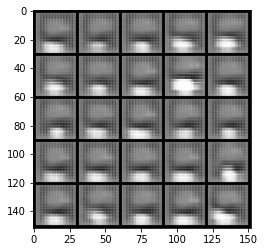

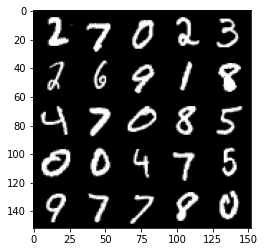

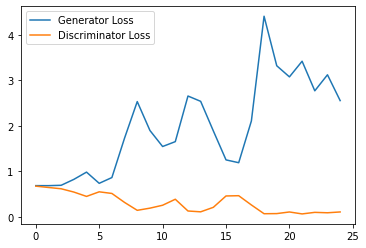

Step 1000: Generator loss: 3.8820097131729128, discriminator loss: 0.09267131009884179


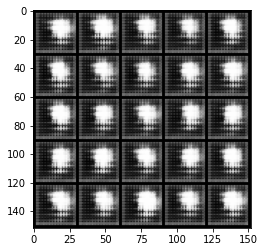

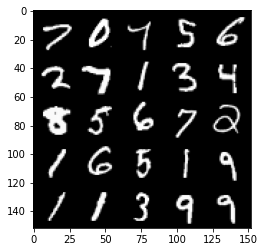

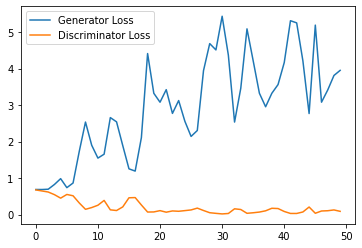

Step 1500: Generator loss: 4.369390728473664, discriminator loss: 0.07678544298652559


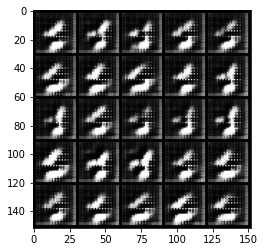

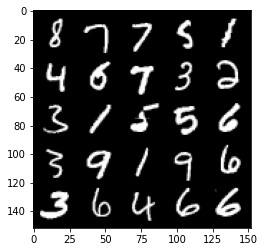

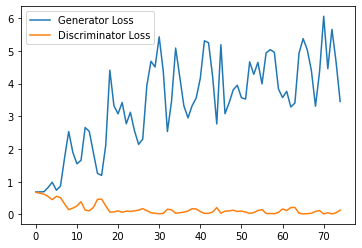

Step 2000: Generator loss: 3.9638964686393736, discriminator loss: 0.08593730605393649


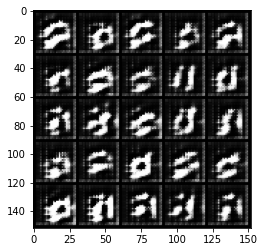

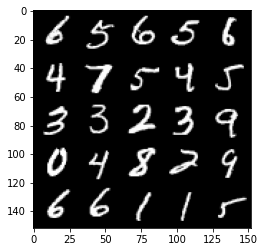

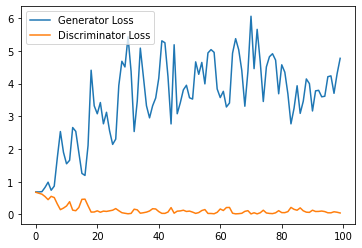

Step 2500: Generator loss: 3.9717718358039855, discriminator loss: 0.09725583299994468


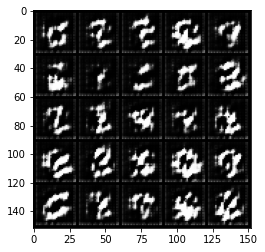

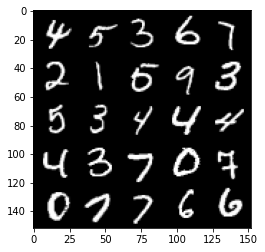

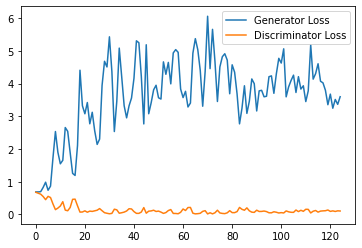

Step 3000: Generator loss: 2.9058721706867217, discriminator loss: 0.19698723584413527


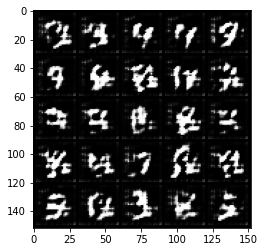

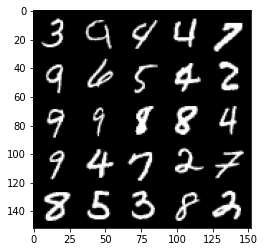

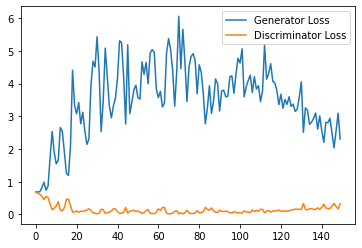

Step 3500: Generator loss: 2.5530360791683195, discriminator loss: 0.26188799713551997


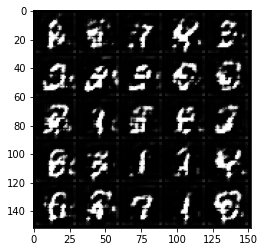

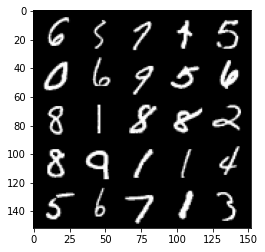

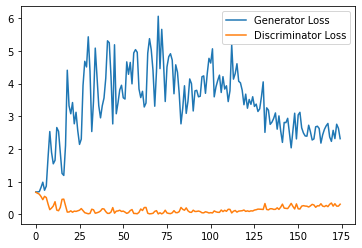

Step 4000: Generator loss: 2.5442586495876314, discriminator loss: 0.28427654330432417


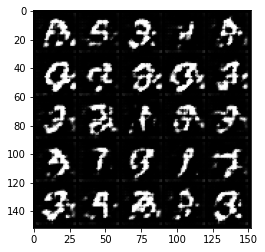

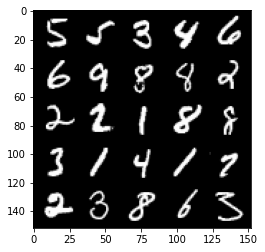

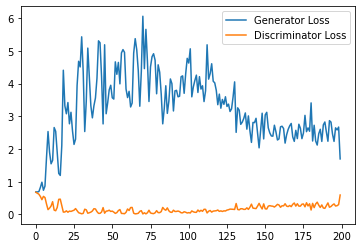

Step 4500: Generator loss: 2.0708256814479826, discriminator loss: 0.29652158938348294


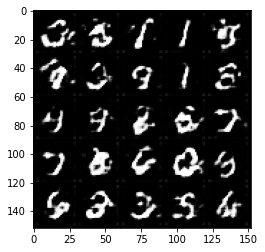

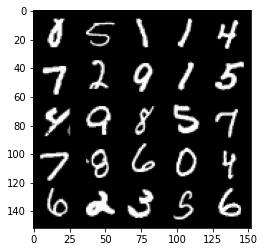

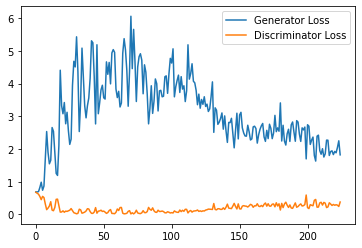

Step 5000: Generator loss: 2.0373029823303224, discriminator loss: 0.31797054088115695


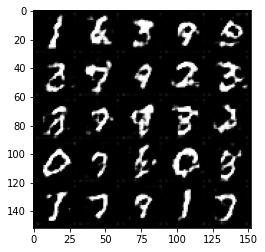

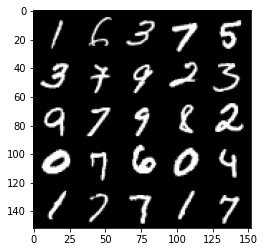

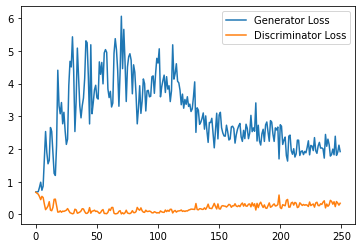

Step 5500: Generator loss: 1.8468232647180558, discriminator loss: 0.3482540080845356


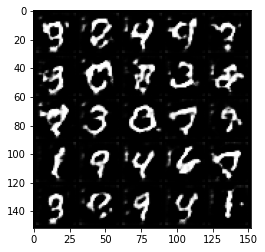

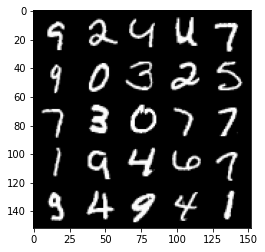

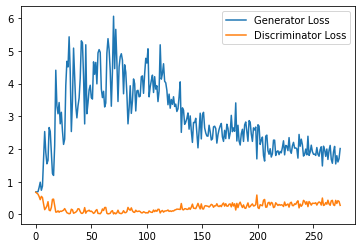

Step 6000: Generator loss: 1.7121937351226806, discriminator loss: 0.4031951614022255


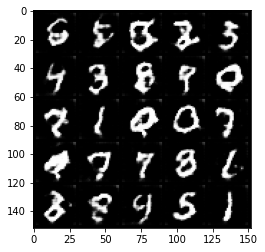

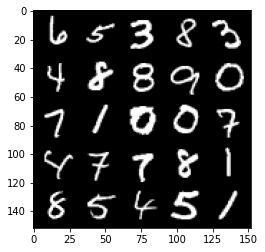

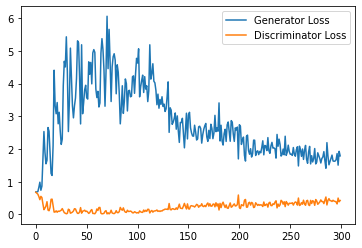

Step 6500: Generator loss: 1.6245114364624023, discriminator loss: 0.4232605099976063


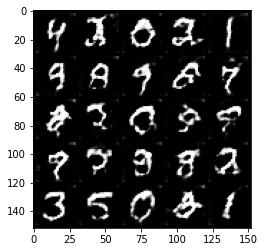

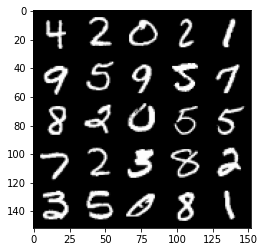

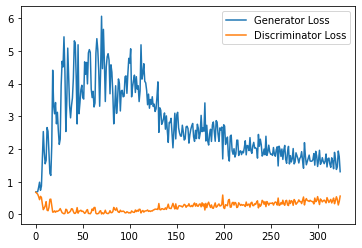

Step 7000: Generator loss: 1.4906952564716338, discriminator loss: 0.44947540313005446


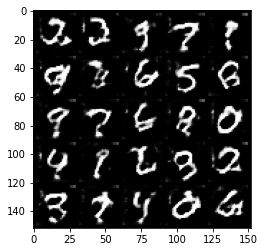

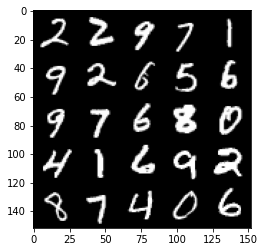

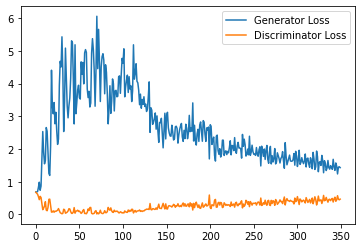

Step 7500: Generator loss: 1.3930559957027435, discriminator loss: 0.48718416202068326


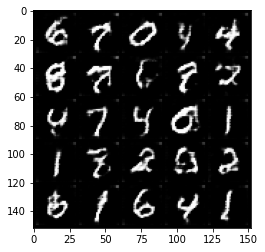

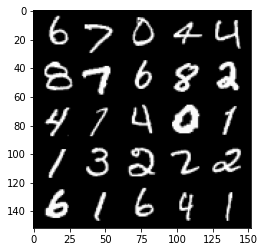

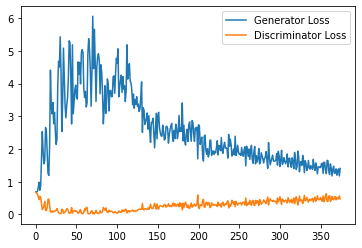

Step 8000: Generator loss: 1.3713799146413803, discriminator loss: 0.5100534854531288


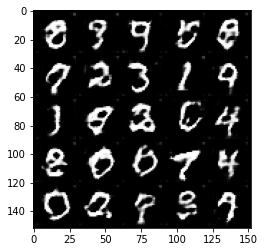

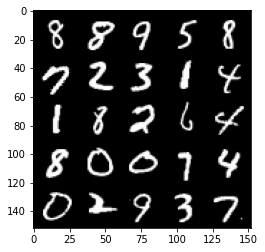

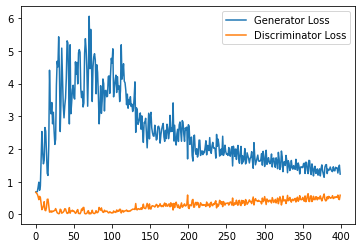

Step 8500: Generator loss: 1.3109889849424363, discriminator loss: 0.5255545459389687


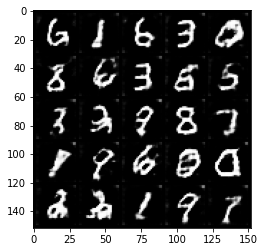

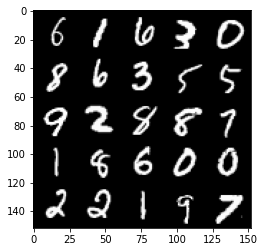

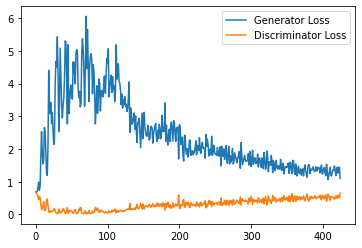

Step 9000: Generator loss: 1.3217939018011093, discriminator loss: 0.5380503149032593


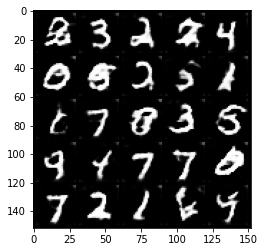

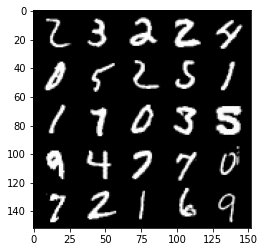

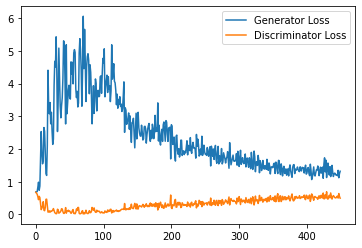

Step 9500: Generator loss: 1.2798342431783676, discriminator loss: 0.5447494173049927


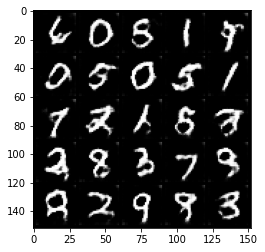

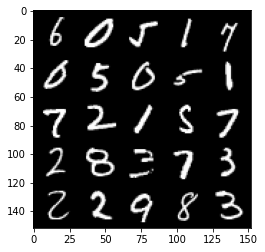

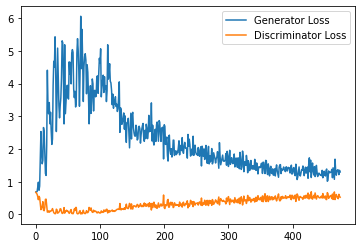

Step 10000: Generator loss: 1.1947572146654128, discriminator loss: 0.5691624211668969


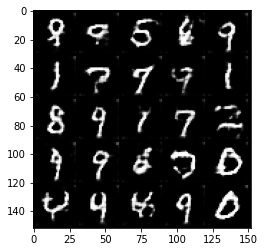

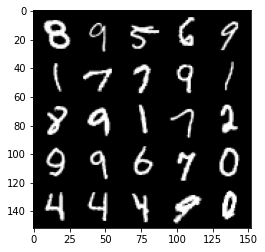

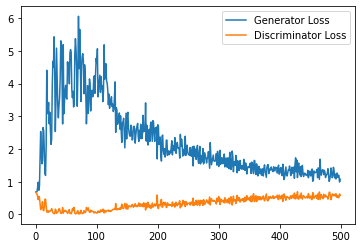

Step 10500: Generator loss: 1.142439708709717, discriminator loss: 0.5677661049962044


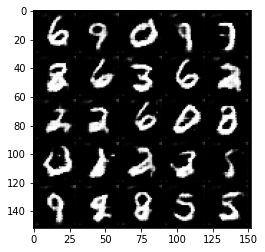

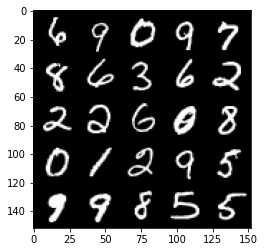

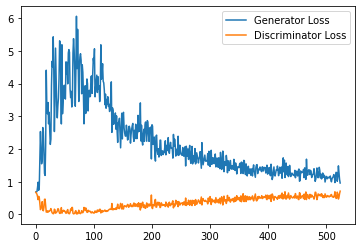

Step 11000: Generator loss: 1.2115857124328613, discriminator loss: 0.5762907850146294


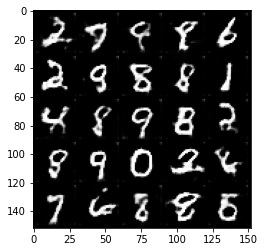

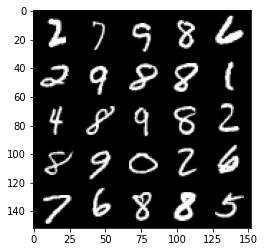

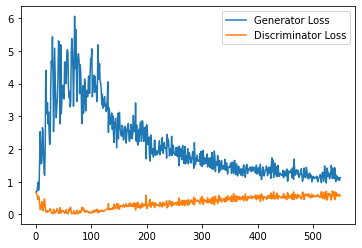

Step 11500: Generator loss: 1.0806261174678802, discriminator loss: 0.5769609544277191


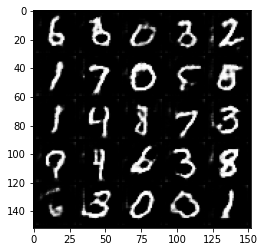

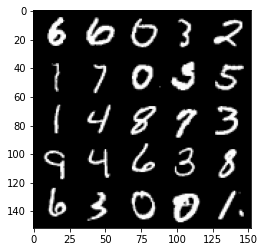

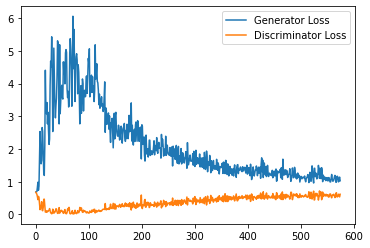

Step 12000: Generator loss: 1.0910104447603226, discriminator loss: 0.5942396587729454


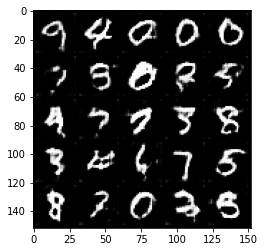

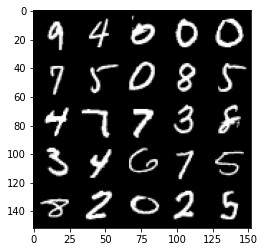

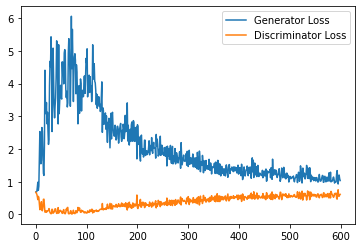

Step 12500: Generator loss: 1.09665788769722, discriminator loss: 0.5905378707051278


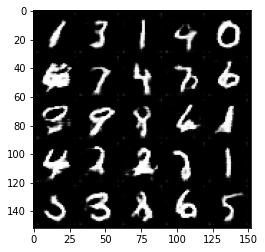

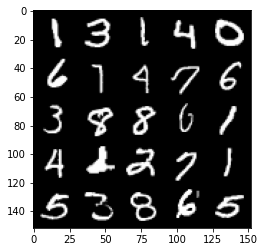

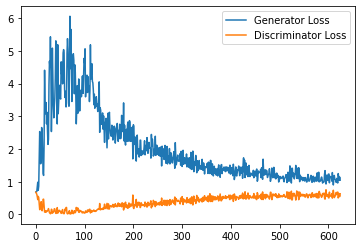

Step 13000: Generator loss: 1.081632786989212, discriminator loss: 0.5824107736945152


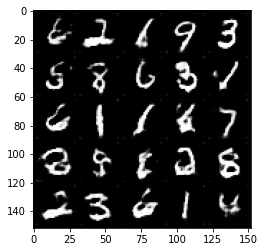

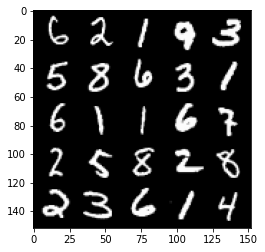

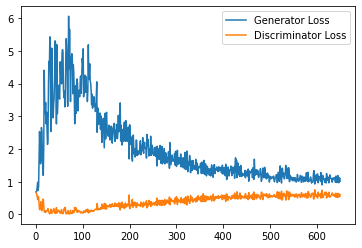

Step 13500: Generator loss: 1.0226553465127945, discriminator loss: 0.5904949513673783


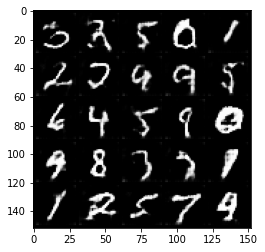

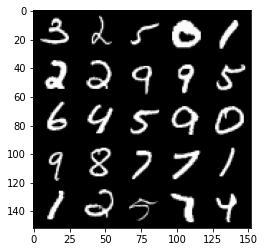

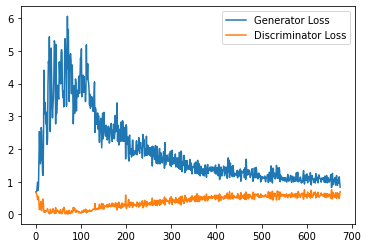

Step 14000: Generator loss: 1.0488602968454361, discriminator loss: 0.593653113424778


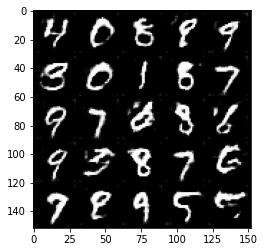

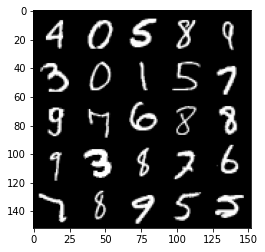

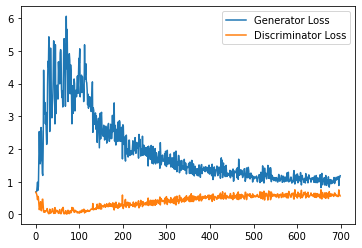

Step 14500: Generator loss: 1.0805891127586364, discriminator loss: 0.5971028231978417


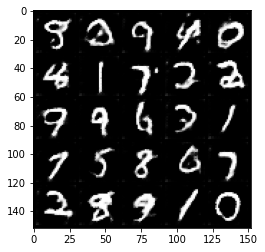

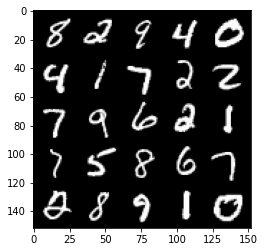

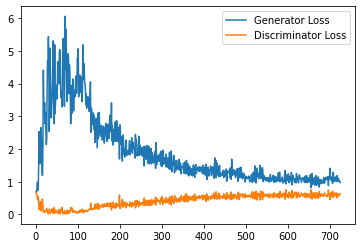

Step 15000: Generator loss: 1.027150612950325, discriminator loss: 0.5976534863710403


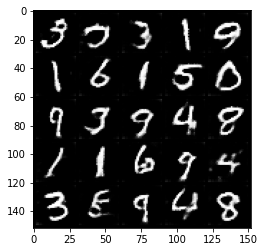

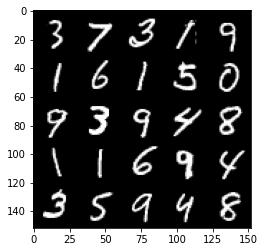

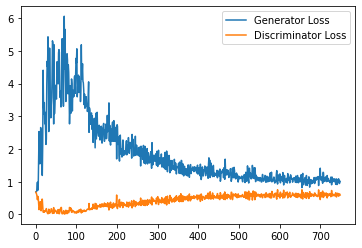

Step 15500: Generator loss: 1.0051806806325911, discriminator loss: 0.5959331681132316


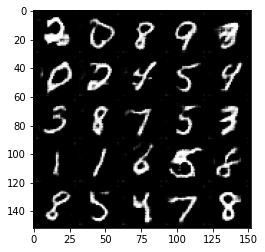

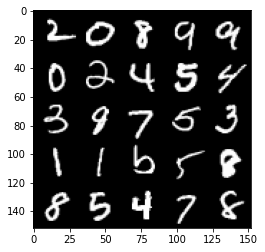

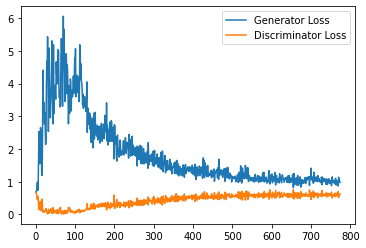

Step 16000: Generator loss: 1.0277663906812669, discriminator loss: 0.5964525728225708


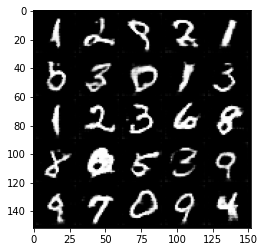

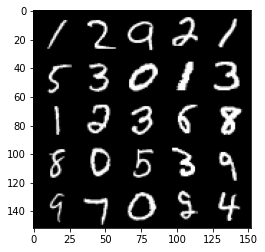

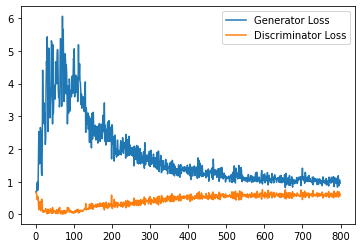

Step 16500: Generator loss: 1.0319649910926818, discriminator loss: 0.6019803950190544


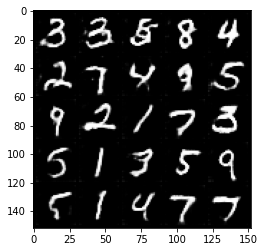

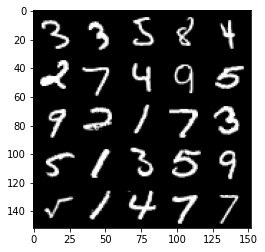

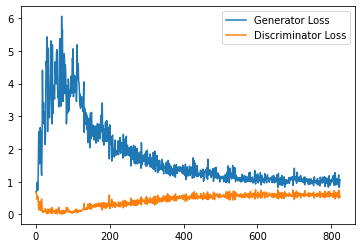

Step 17000: Generator loss: 1.0054223256111146, discriminator loss: 0.5977505229711533


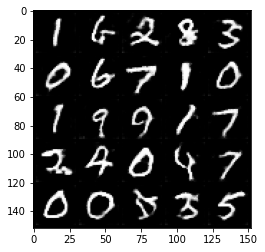

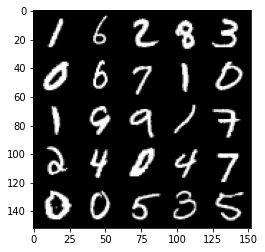

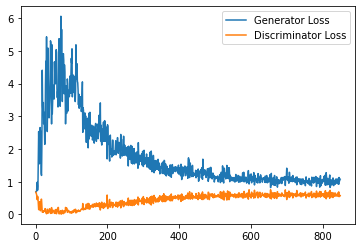

Step 17500: Generator loss: 1.0928260893821717, discriminator loss: 0.6007508808374404


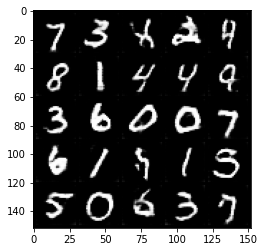

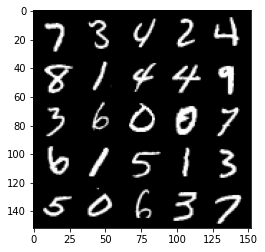

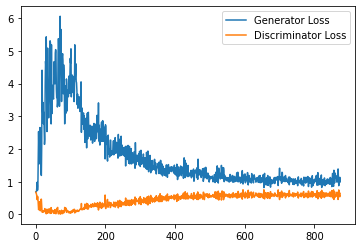

Step 18000: Generator loss: 0.9961714043617248, discriminator loss: 0.5986647225618362


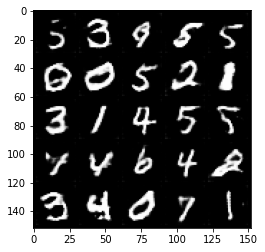

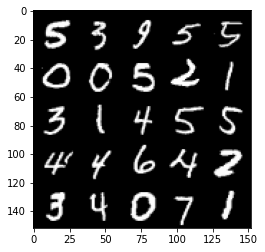

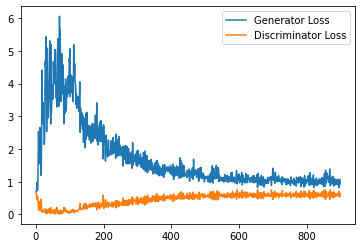

Step 18500: Generator loss: 0.9951199116706848, discriminator loss: 0.608830879509449


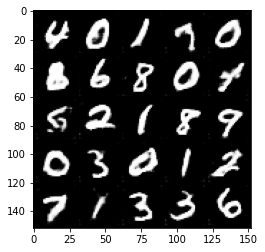

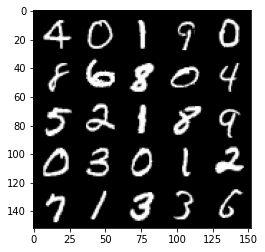

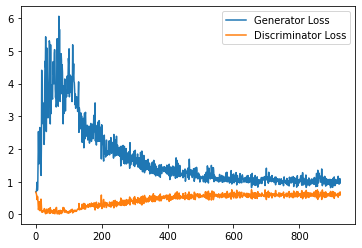

Step 19000: Generator loss: 1.0156813285350799, discriminator loss: 0.5969640129804611


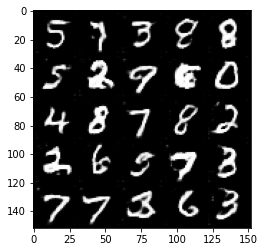

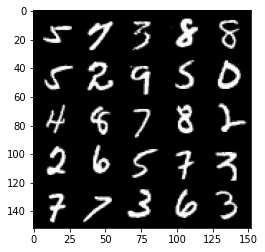

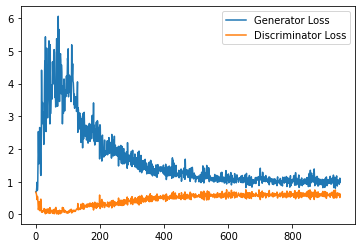

Step 19500: Generator loss: 1.0111980446577071, discriminator loss: 0.6007048301100731


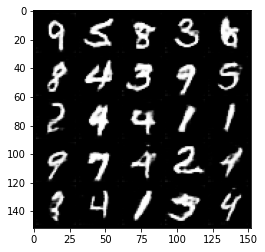

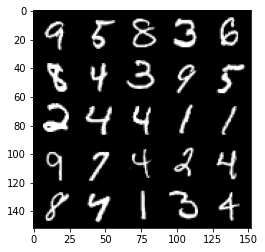

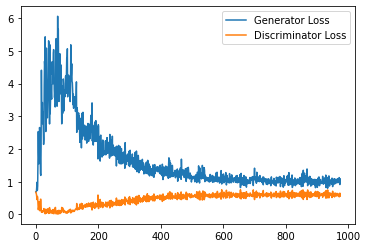

Step 20000: Generator loss: 1.0262660566568376, discriminator loss: 0.6016334217786788


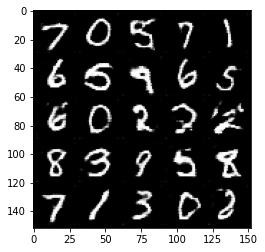

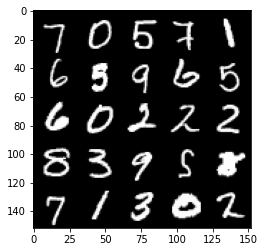

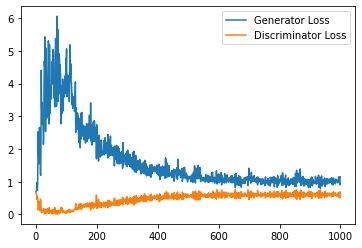

Step 20500: Generator loss: 1.0150301601886749, discriminator loss: 0.5967106457948684


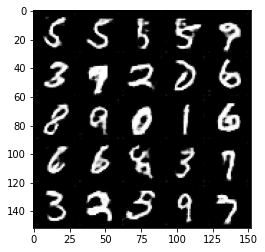

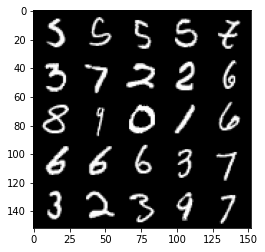

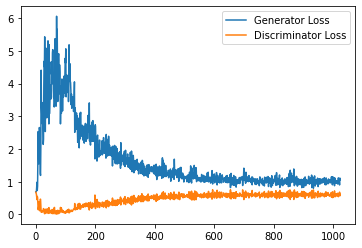

Step 21000: Generator loss: 0.9859611467123032, discriminator loss: 0.6049096854329109


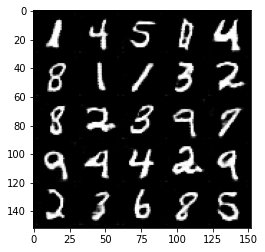

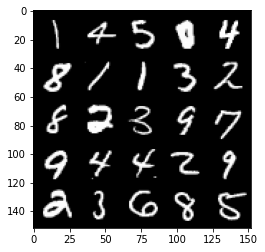

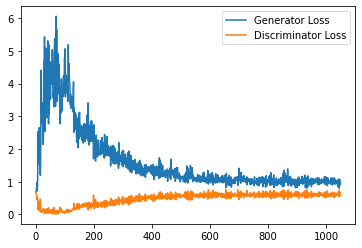

Step 21500: Generator loss: 0.9954298151731491, discriminator loss: 0.6023071359395981


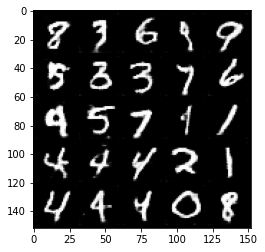

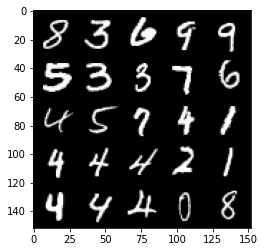

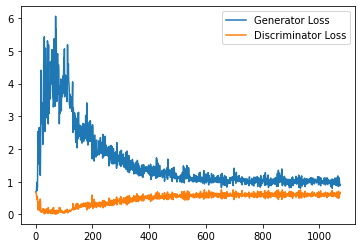

Step 22000: Generator loss: 0.974123046040535, discriminator loss: 0.6030970342755317


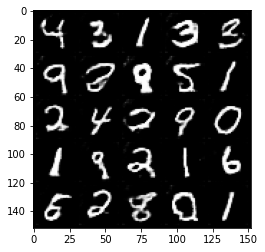

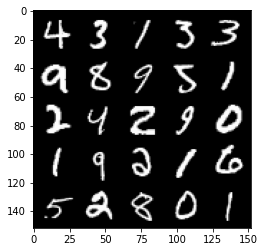

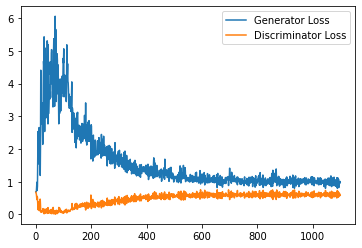

Step 22500: Generator loss: 0.9765390404462815, discriminator loss: 0.6030096212625503


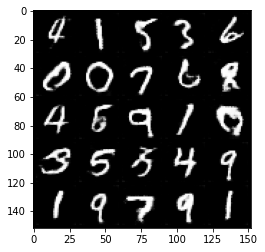

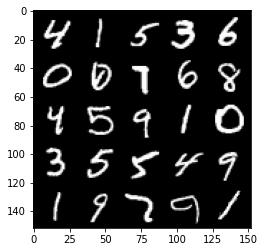

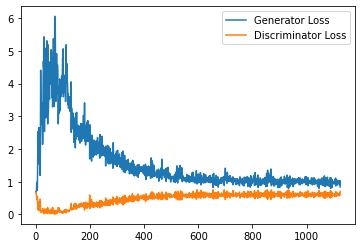

Step 23000: Generator loss: 0.9869967885017396, discriminator loss: 0.5965762469768524


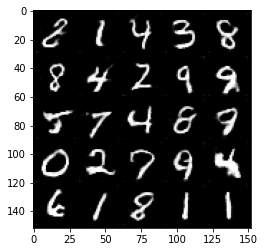

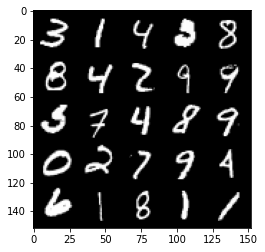

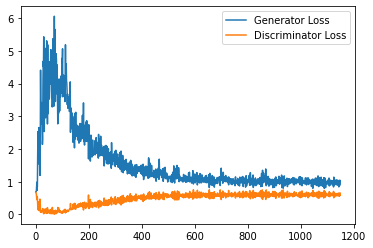

Step 23500: Generator loss: 0.9705865352153779, discriminator loss: 0.6028000268936157


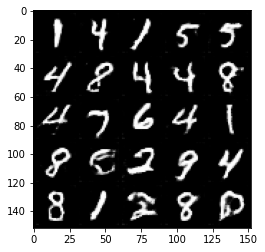

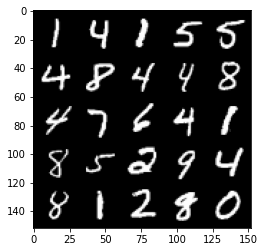

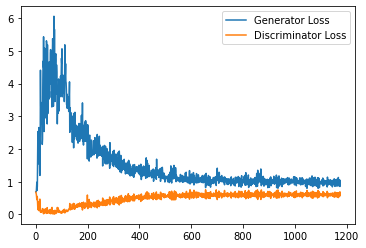

Step 24000: Generator loss: 0.9855568630695343, discriminator loss: 0.6014588639736176


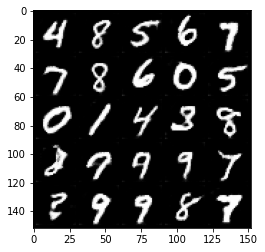

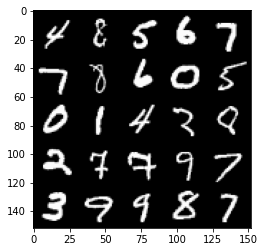

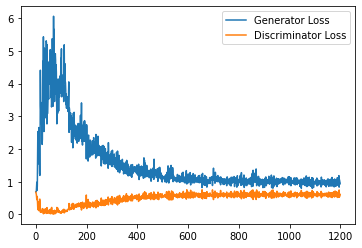

Step 24500: Generator loss: 0.9596704351902008, discriminator loss: 0.609522130548954


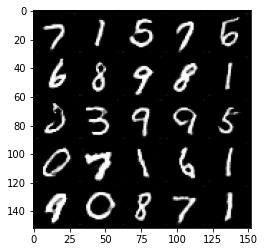

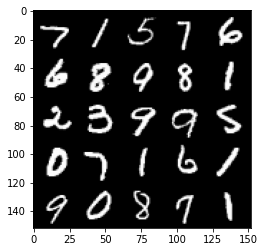

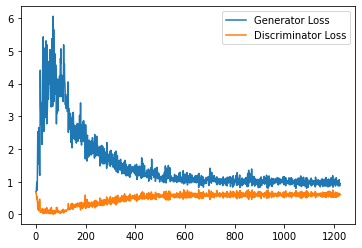

Step 25000: Generator loss: 0.9598969148397446, discriminator loss: 0.6025524883270263


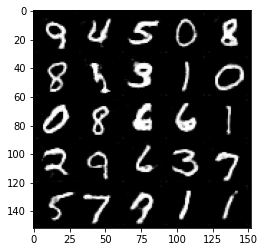

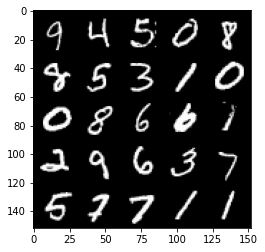

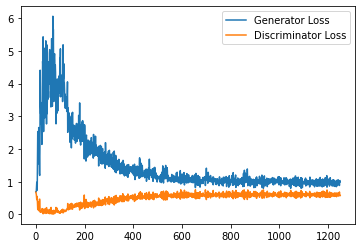

Step 25500: Generator loss: 0.9700020817518235, discriminator loss: 0.6086793847680092


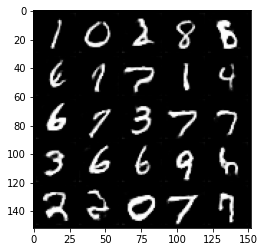

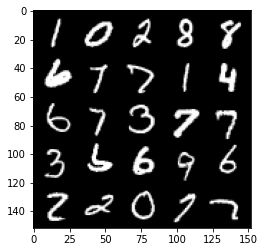

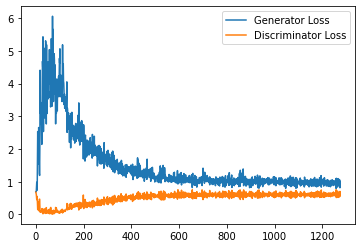

Step 26000: Generator loss: 0.9627756081819534, discriminator loss: 0.6064540286064148


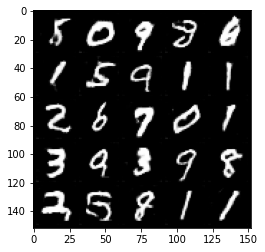

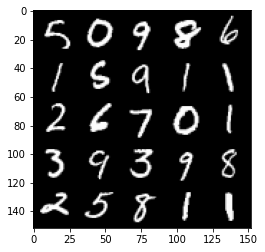

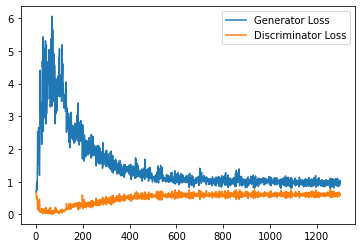

Step 26500: Generator loss: 0.9811086419820786, discriminator loss: 0.6070320554971695


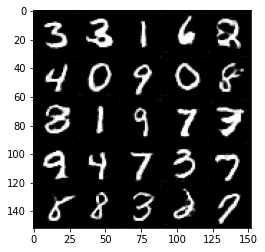

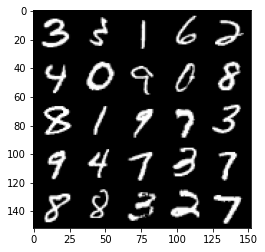

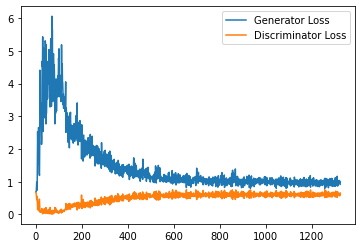

Step 27000: Generator loss: 0.9697899079322815, discriminator loss: 0.6082515930533409


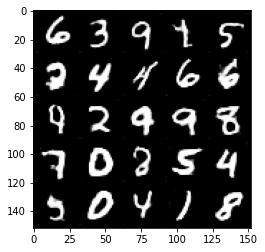

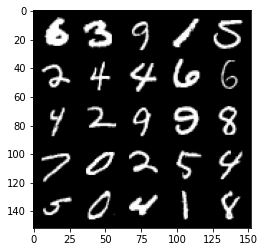

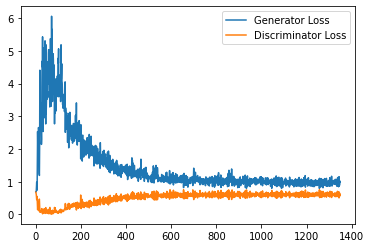

Step 27500: Generator loss: 0.9677299069166183, discriminator loss: 0.6071815569996833


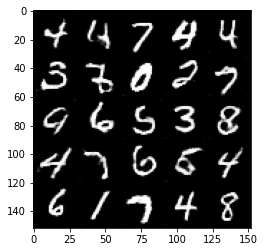

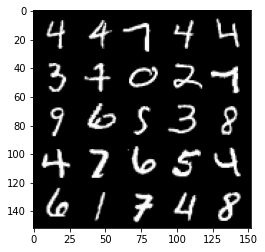

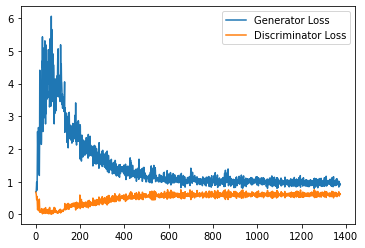

Step 28000: Generator loss: 0.952401428103447, discriminator loss: 0.6015105136036872


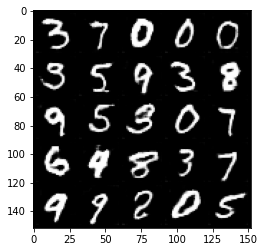

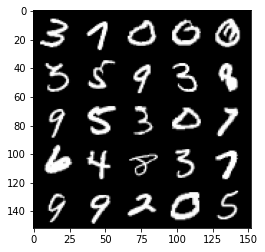

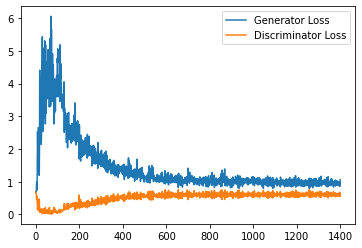

Step 28500: Generator loss: 0.9703482629060746, discriminator loss: 0.6065582001209259


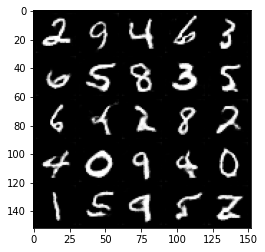

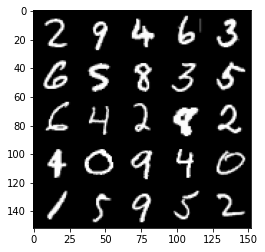

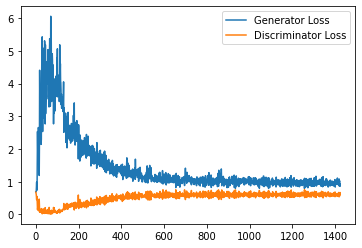

Step 29000: Generator loss: 0.9815876780748367, discriminator loss: 0.6042428128123284


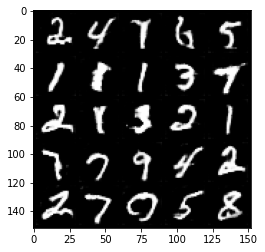

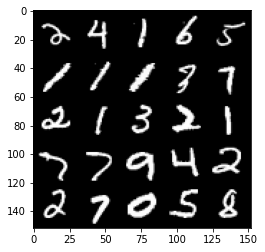

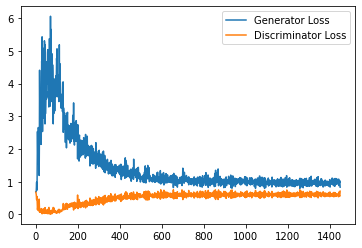

Step 29500: Generator loss: 0.9594062747955322, discriminator loss: 0.6072300966978074


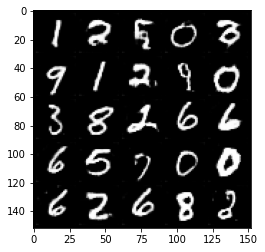

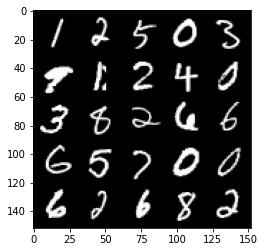

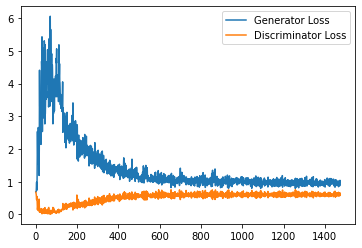

Step 30000: Generator loss: 0.9634658285379409, discriminator loss: 0.614320988357067


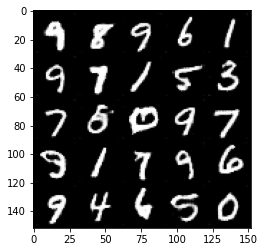

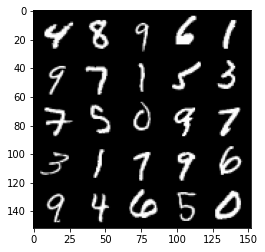

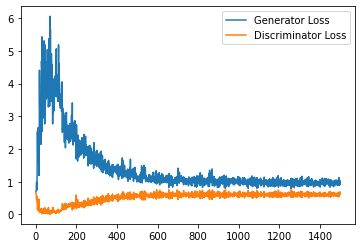

Step 30500: Generator loss: 0.9352670474052429, discriminator loss: 0.6096968314051628


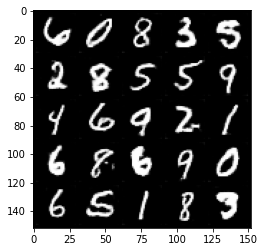

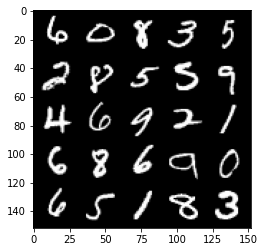

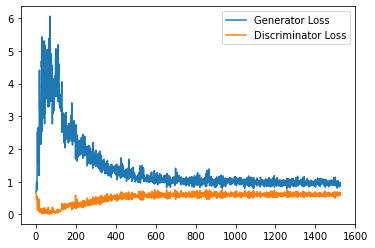

Step 31000: Generator loss: 0.9361268991231918, discriminator loss: 0.6106062825918198


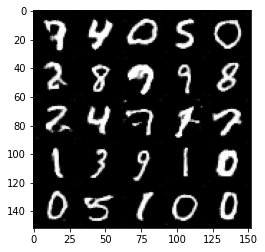

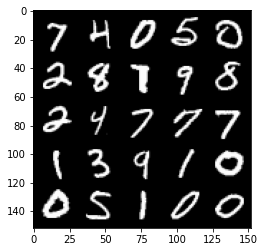

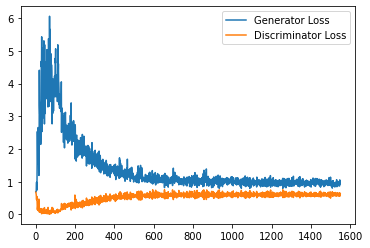

Step 31500: Generator loss: 0.9474497156143189, discriminator loss: 0.6100138492584228


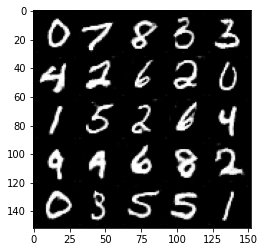

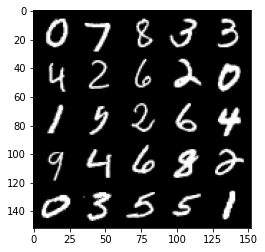

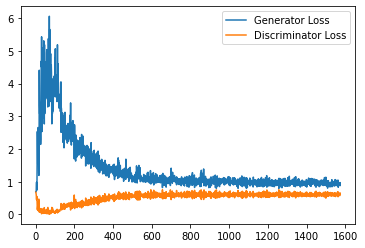

Step 32000: Generator loss: 0.9565882096290589, discriminator loss: 0.6134684584140777


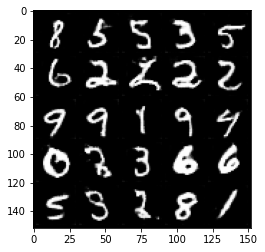

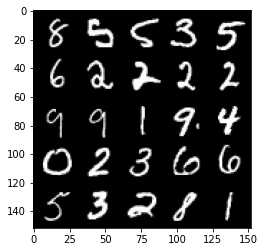

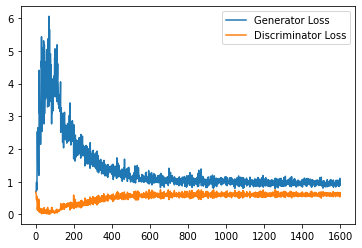

Step 32500: Generator loss: 0.96634326004982, discriminator loss: 0.617101614177227


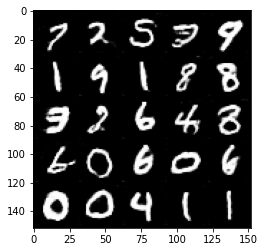

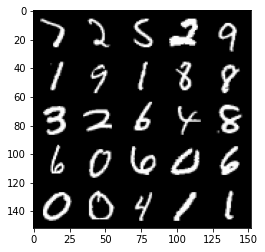

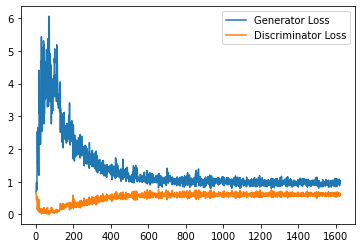

Step 33000: Generator loss: 0.9744027580022812, discriminator loss: 0.6178120704293251


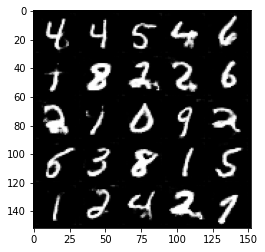

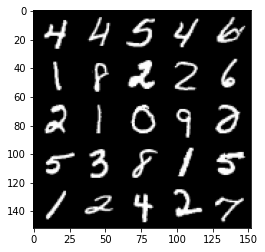

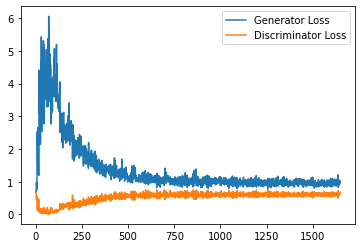

Step 33500: Generator loss: 0.9580045652389526, discriminator loss: 0.6192791529297829


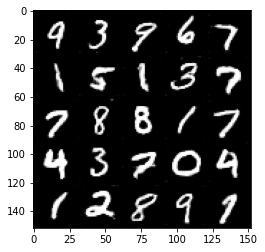

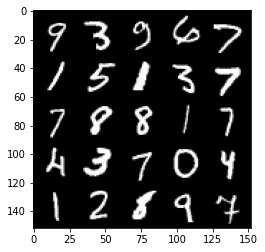

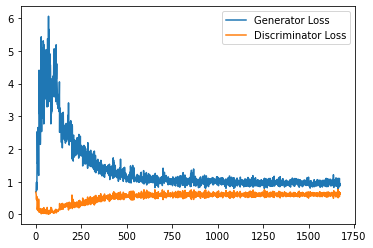

Step 34000: Generator loss: 0.9271695007085801, discriminator loss: 0.6160938171744347


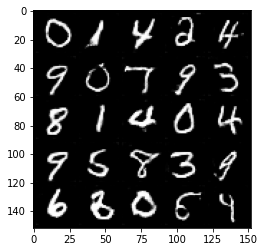

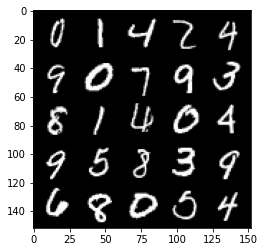

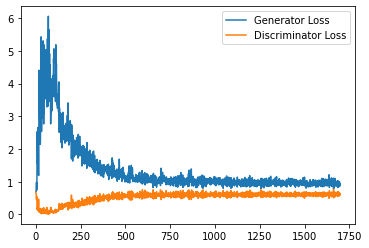

Step 34500: Generator loss: 0.9344328284263611, discriminator loss: 0.6137023684978485


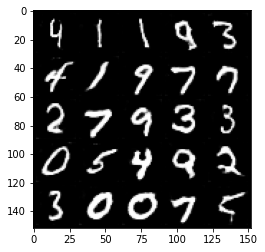

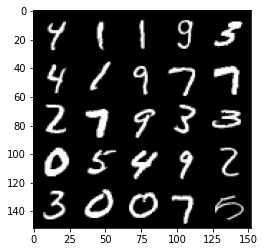

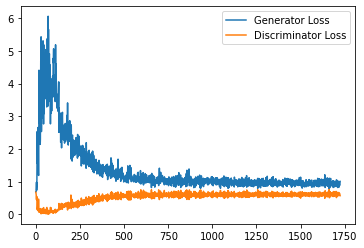

Step 35000: Generator loss: 0.9383610309362411, discriminator loss: 0.6185685932040215


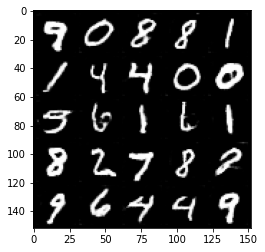

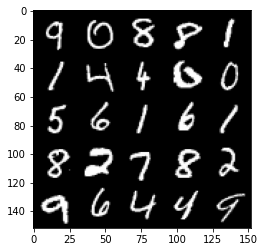

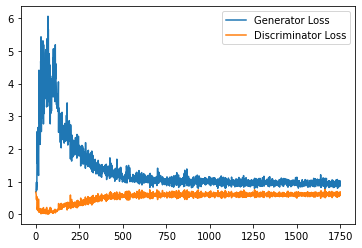

Step 35500: Generator loss: 0.9510086302757264, discriminator loss: 0.6138298490047455


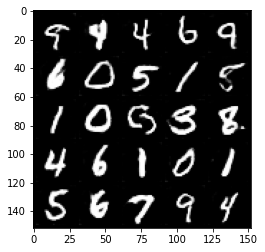

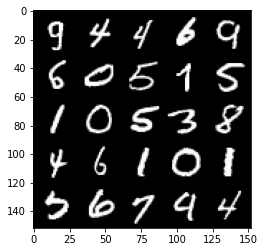

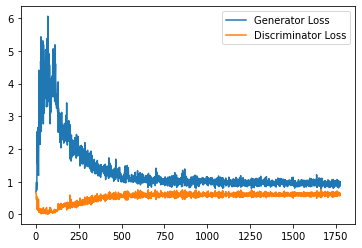

Step 36000: Generator loss: 0.9498302228450776, discriminator loss: 0.617065153837204


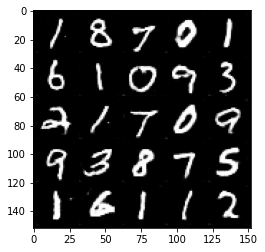

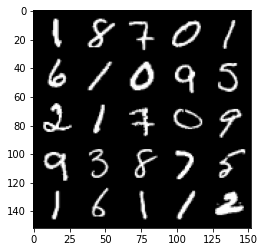

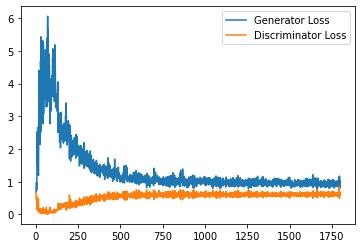

Step 36500: Generator loss: 0.946777996301651, discriminator loss: 0.6158643550872803


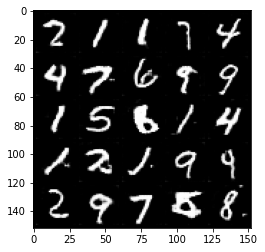

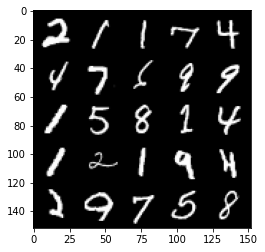

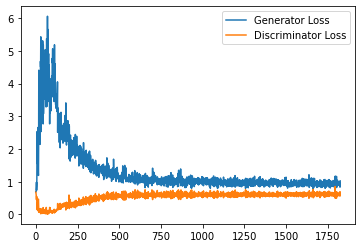

Step 37000: Generator loss: 0.9434179328680038, discriminator loss: 0.6210162321925163


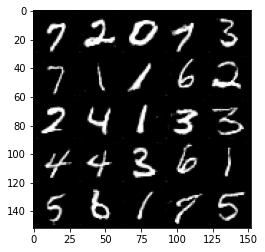

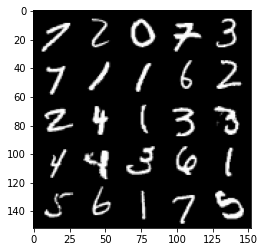

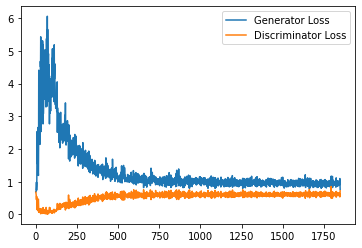

Step 37500: Generator loss: 0.9379965524673461, discriminator loss: 0.6143640158772469


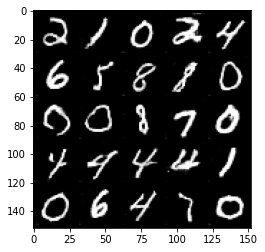

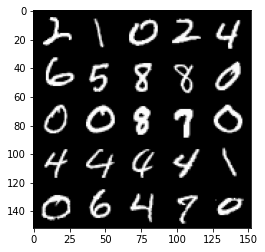

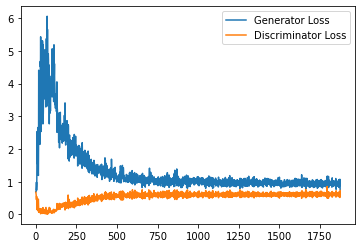

Step 38000: Generator loss: 0.9362690224647522, discriminator loss: 0.6139457166790963


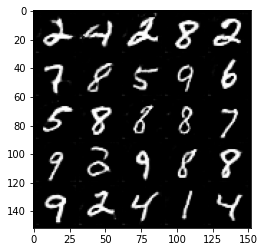

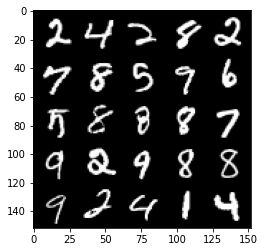

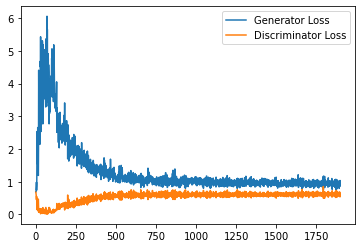

Step 38500: Generator loss: 0.9336904832124711, discriminator loss: 0.6185528293251992


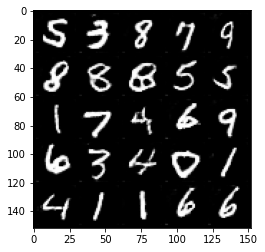

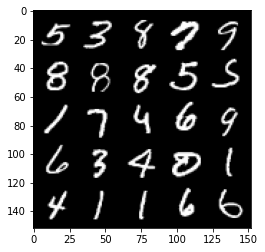

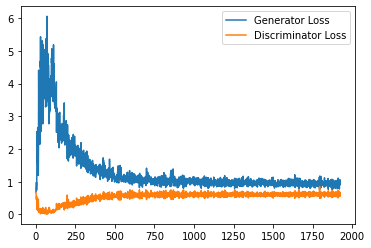

Step 39000: Generator loss: 0.9330917873382568, discriminator loss: 0.6187190654277801


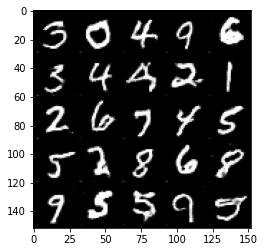

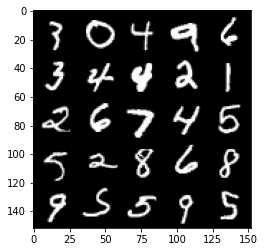

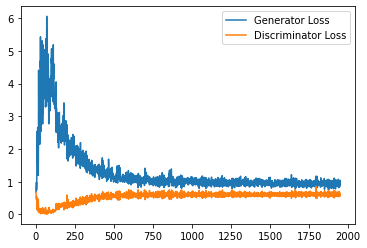

Step 39500: Generator loss: 0.9317972279787063, discriminator loss: 0.6117267043590545


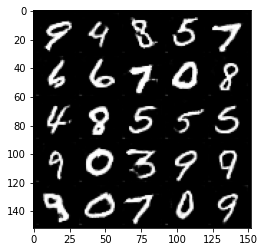

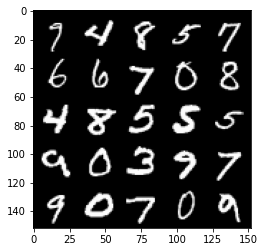

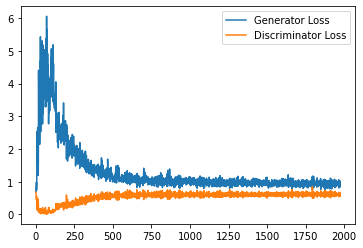

Step 40000: Generator loss: 0.9439572556018829, discriminator loss: 0.6158933206796646


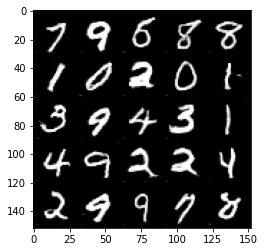

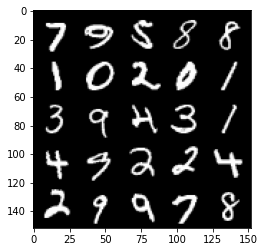

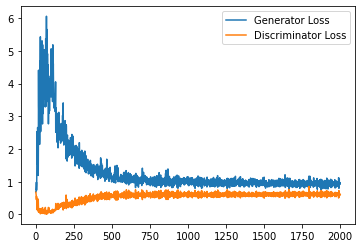

Step 40500: Generator loss: 0.9287121379375458, discriminator loss: 0.6178411613106728


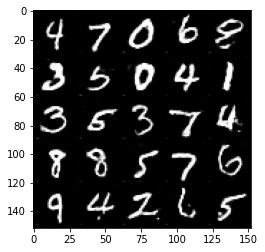

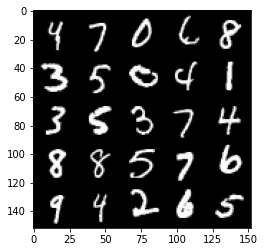

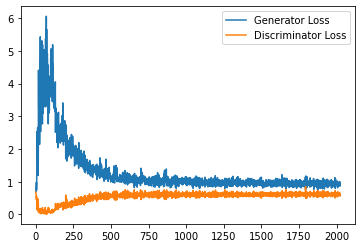

Step 41000: Generator loss: 0.9386703534126282, discriminator loss: 0.6110956404209137


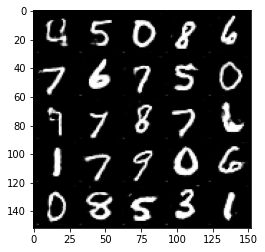

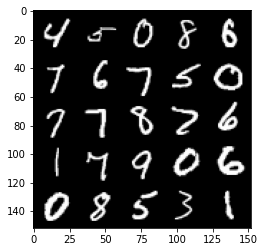

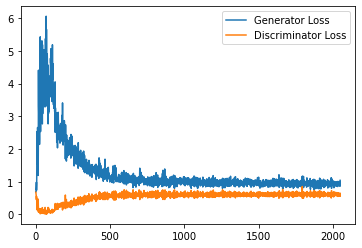

Step 41500: Generator loss: 0.9477775313854218, discriminator loss: 0.6127297100424767


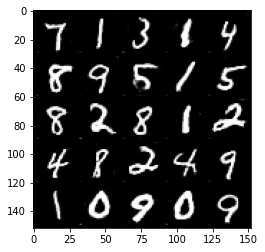

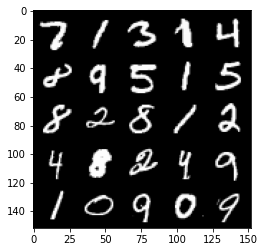

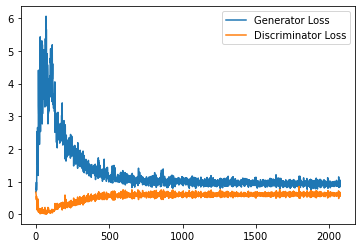

Step 42000: Generator loss: 0.9289679415225983, discriminator loss: 0.6144945578575134


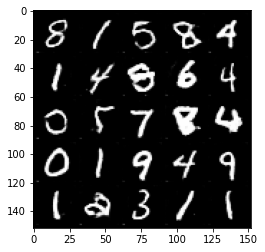

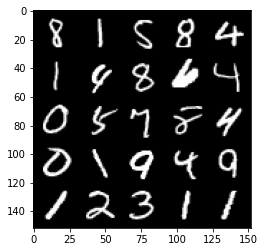

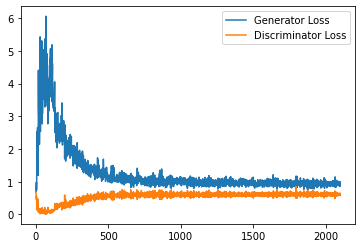

Step 42500: Generator loss: 0.9298382940292358, discriminator loss: 0.6149953471422196


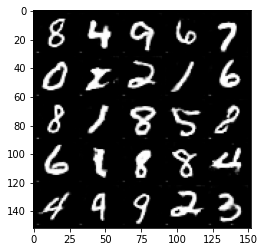

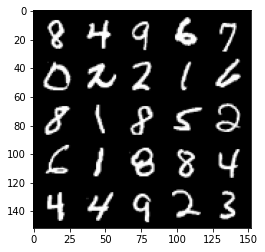

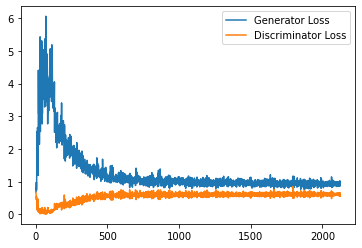

Step 43000: Generator loss: 0.9333692589998245, discriminator loss: 0.6120642623305321


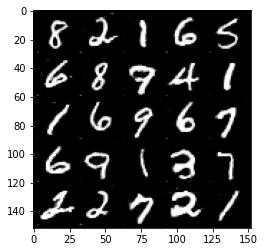

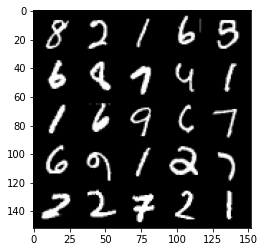

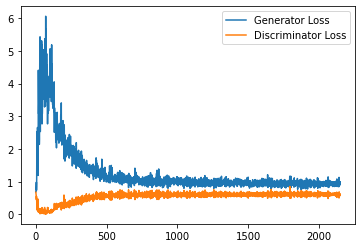

Step 43500: Generator loss: 0.9586062543392181, discriminator loss: 0.6114408476948738


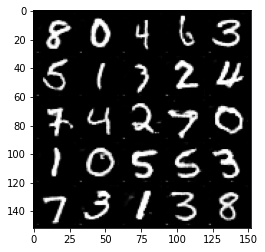

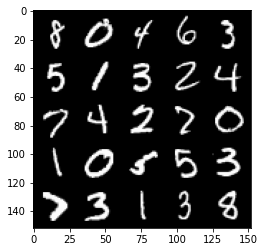

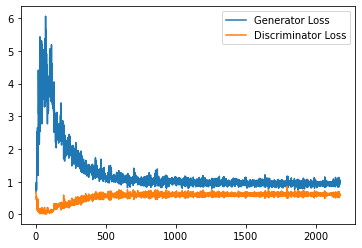

Step 44000: Generator loss: 0.9515741966962814, discriminator loss: 0.615879182100296


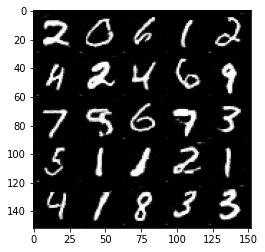

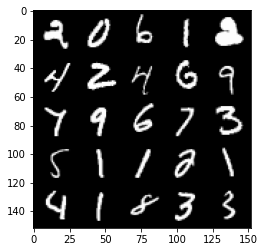

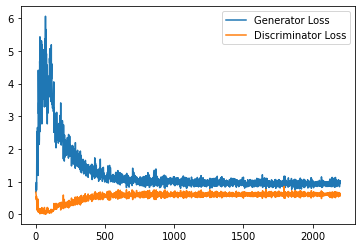

Step 44500: Generator loss: 0.9479112969636917, discriminator loss: 0.6119567753076554


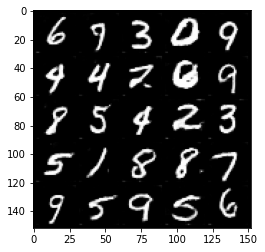

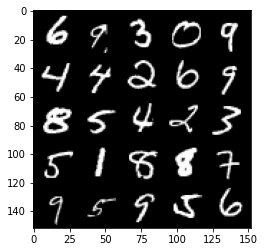

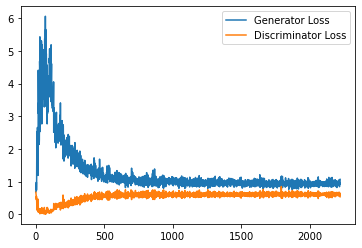

Step 45000: Generator loss: 0.9467377160787582, discriminator loss: 0.611730543076992


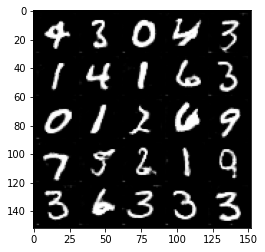

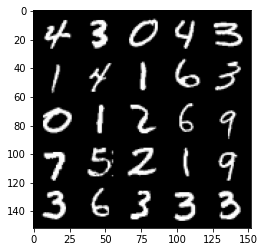

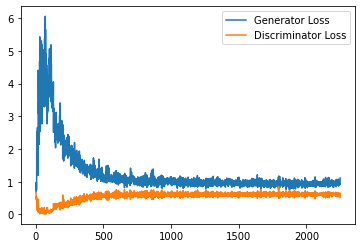

Step 45500: Generator loss: 0.9416532733440399, discriminator loss: 0.6142164065241814


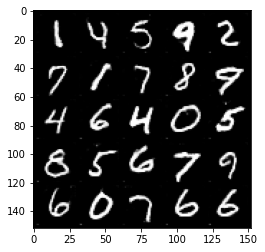

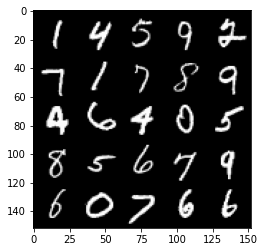

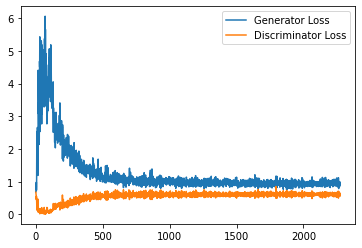

Step 46000: Generator loss: 0.9374993288516998, discriminator loss: 0.6145532740354538


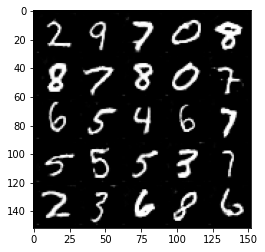

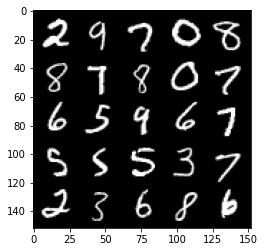

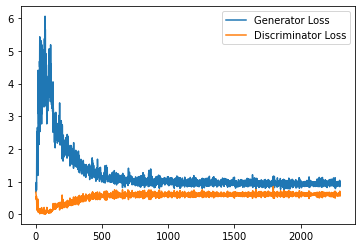

Step 46500: Generator loss: 0.9379250886440277, discriminator loss: 0.6110220746994018


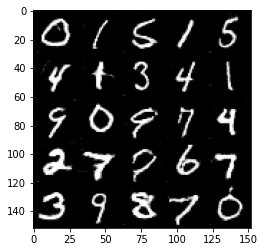

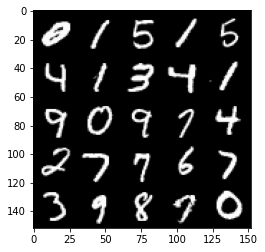

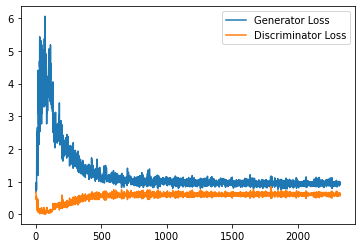

Step 47000: Generator loss: 0.9501550621986389, discriminator loss: 0.6114233995079994


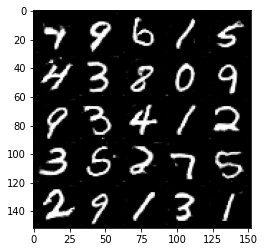

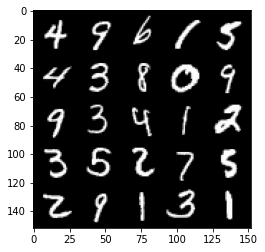

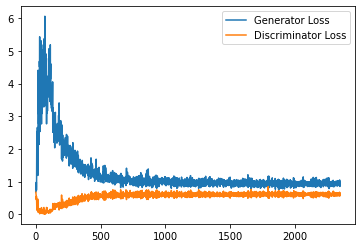

Step 47500: Generator loss: 0.938653463959694, discriminator loss: 0.6108095111250877


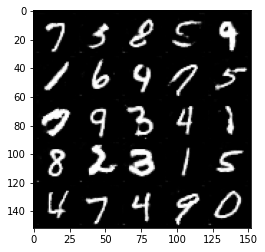

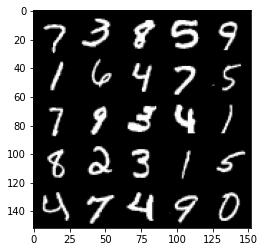

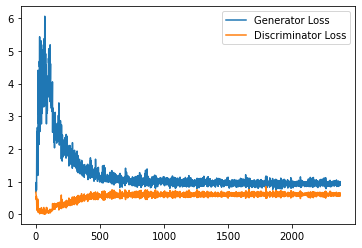

Step 48000: Generator loss: 0.9486359683275223, discriminator loss: 0.6073081112504005


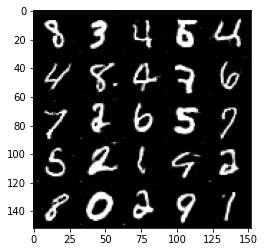

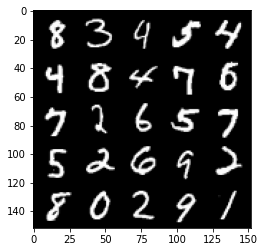

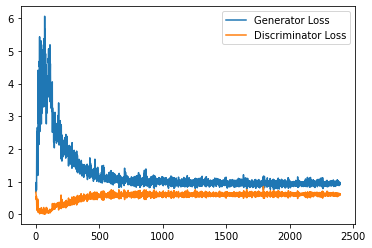

Step 48500: Generator loss: 0.9538137962818146, discriminator loss: 0.6093116952180863


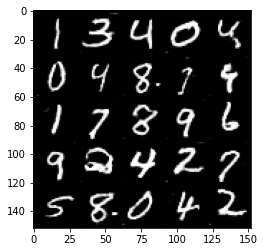

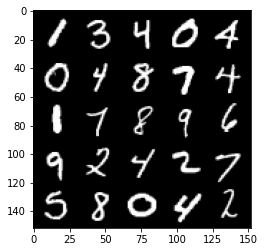

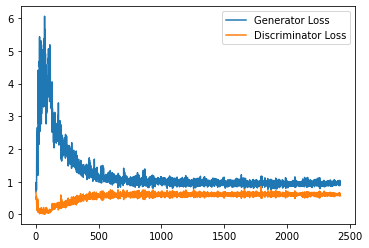

Step 49000: Generator loss: 0.9417230818271637, discriminator loss: 0.606474772810936


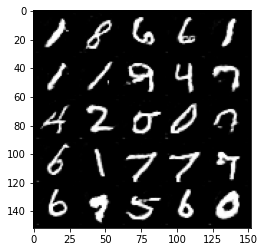

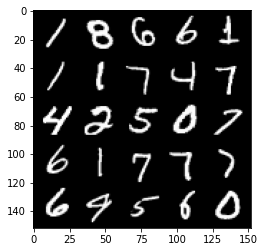

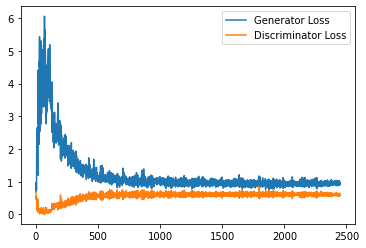

Step 49500: Generator loss: 0.954377425312996, discriminator loss: 0.6077157196998596


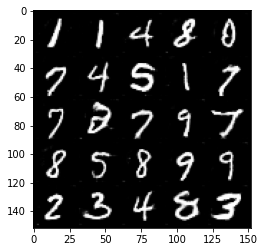

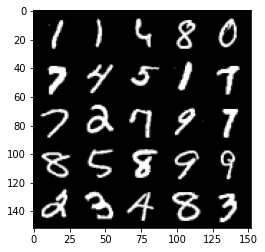

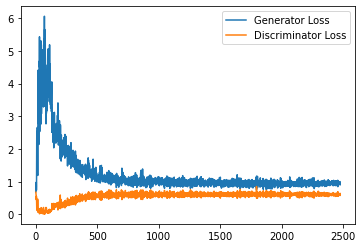

Step 50000: Generator loss: 0.9441784898042679, discriminator loss: 0.6126398351192475


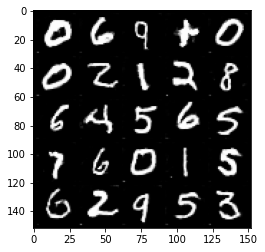

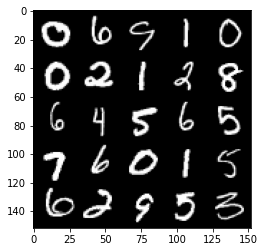

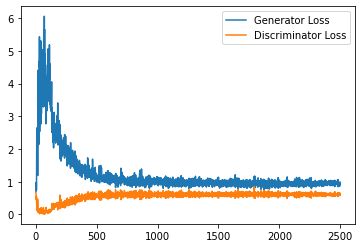

Step 50500: Generator loss: 0.952299575805664, discriminator loss: 0.6066810540556907


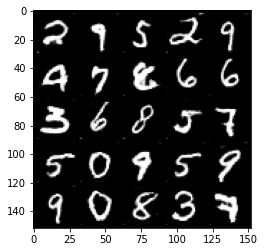

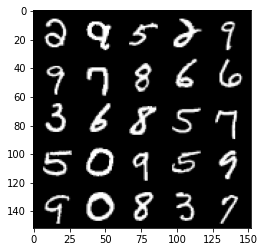

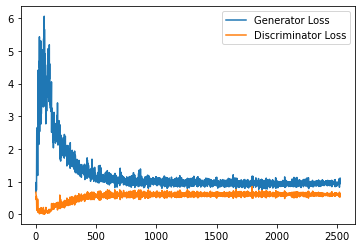

Step 51000: Generator loss: 0.9542153673171997, discriminator loss: 0.6106143273115158


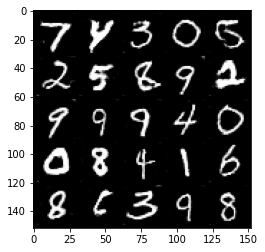

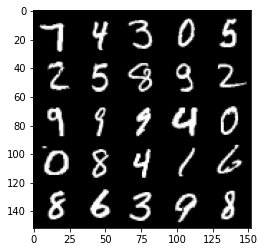

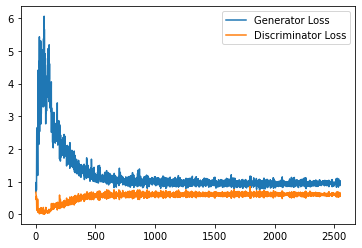

Step 51500: Generator loss: 0.9390003925561905, discriminator loss: 0.6051514046192169


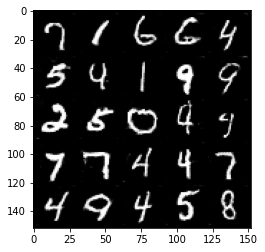

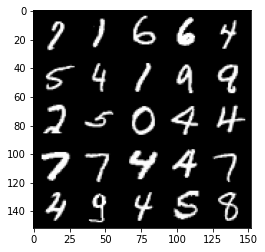

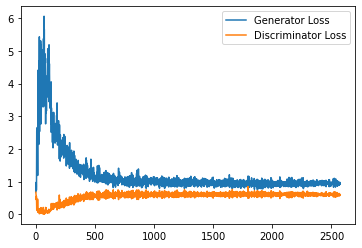

Step 52000: Generator loss: 0.9560504833459854, discriminator loss: 0.6072933444976807


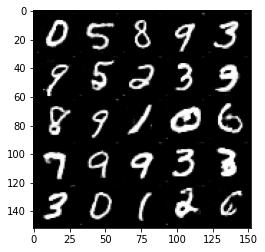

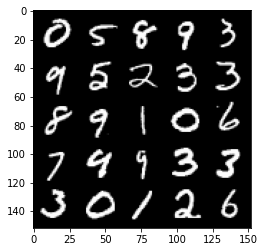

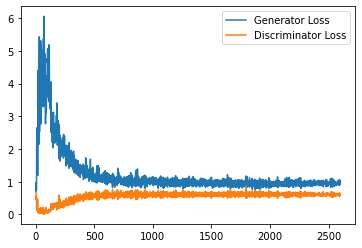

Step 52500: Generator loss: 0.9518181344270706, discriminator loss: 0.6073437237739563


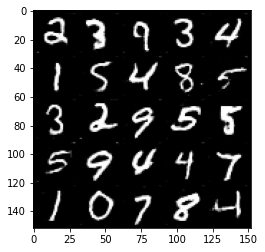

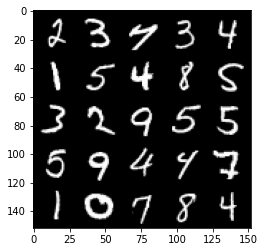

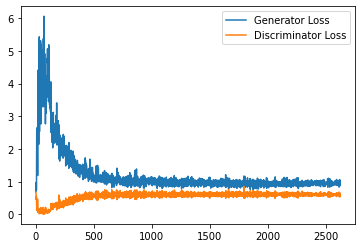

Step 53000: Generator loss: 0.9481076285839081, discriminator loss: 0.6089760113954544


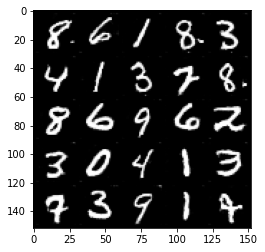

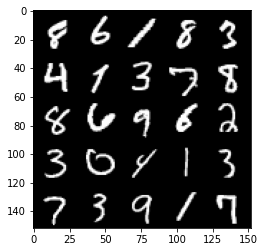

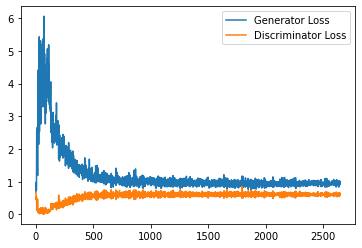

Step 53500: Generator loss: 0.9565186208486557, discriminator loss: 0.607837165415287


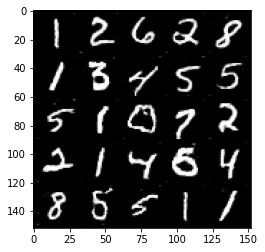

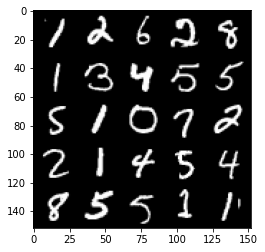

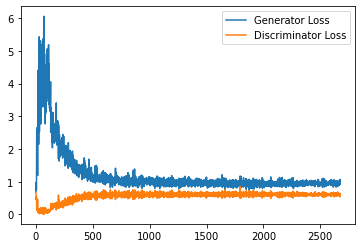

Step 54000: Generator loss: 0.9585266324281693, discriminator loss: 0.6084523320198059


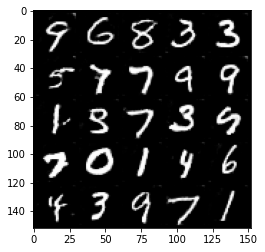

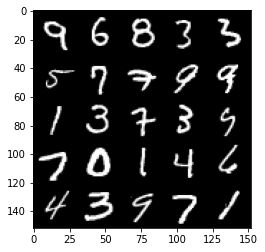

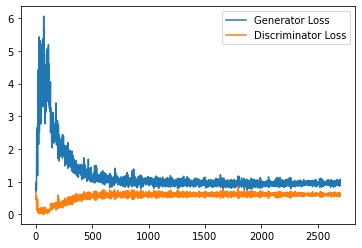

Step 54500: Generator loss: 0.9361711752414703, discriminator loss: 0.6099642963409424


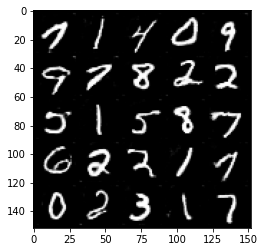

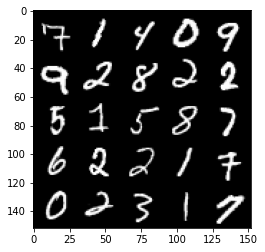

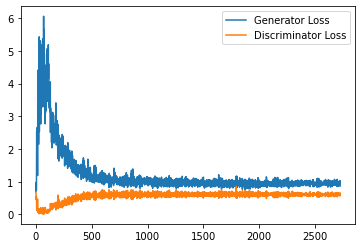

Step 55000: Generator loss: 0.9511291037797928, discriminator loss: 0.6064090602993966


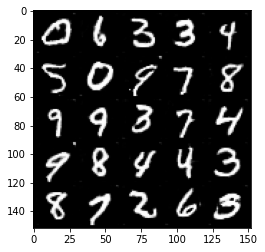

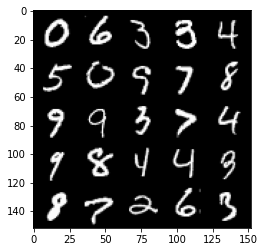

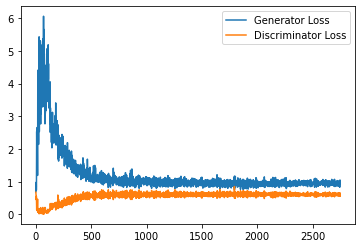

Step 55500: Generator loss: 0.9516839175224304, discriminator loss: 0.6061712892651558


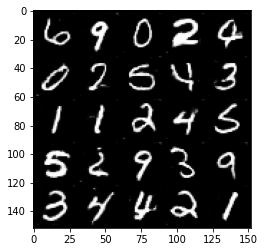

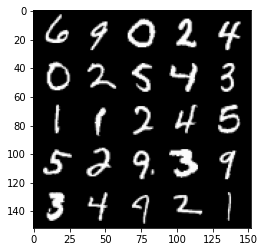

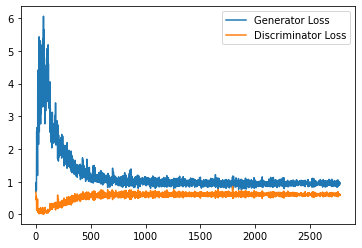

Step 56000: Generator loss: 0.9526932657957077, discriminator loss: 0.6074529304504395


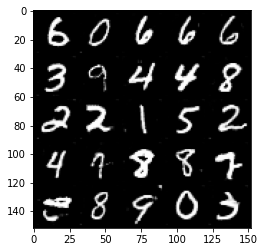

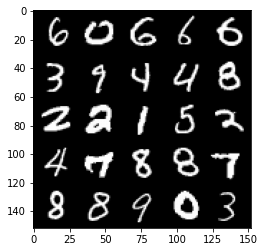

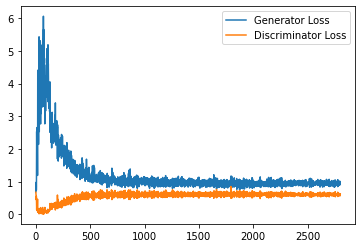

Step 56500: Generator loss: 0.9427033752202988, discriminator loss: 0.608675346493721


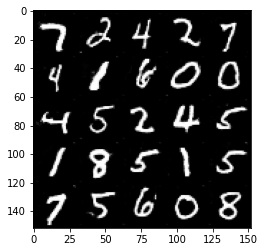

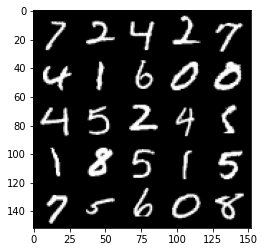

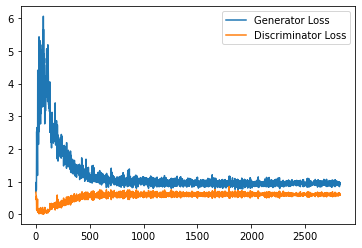

Step 57000: Generator loss: 0.943767263174057, discriminator loss: 0.6069732999205589


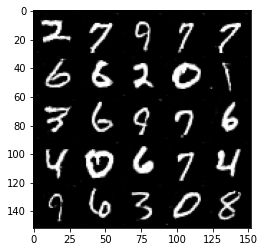

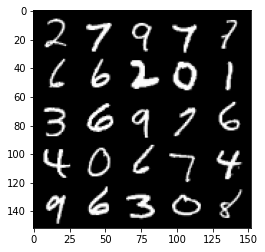

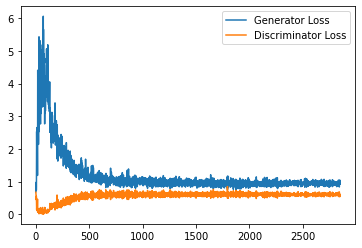

Step 57500: Generator loss: 0.9460856518745422, discriminator loss: 0.6084921730160713


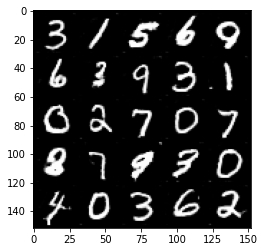

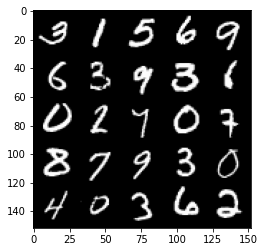

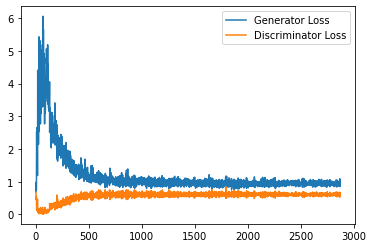

Step 58000: Generator loss: 0.9702845618128777, discriminator loss: 0.6109883940815926


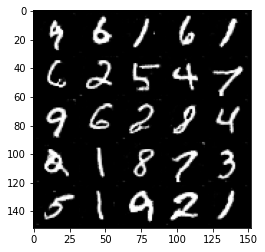

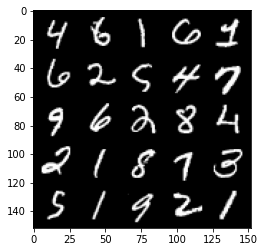

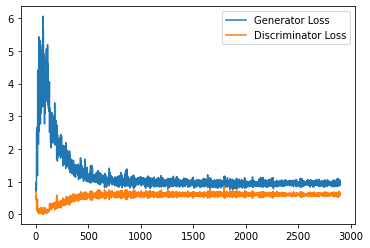

Step 58500: Generator loss: 0.9499301587343216, discriminator loss: 0.601229238986969


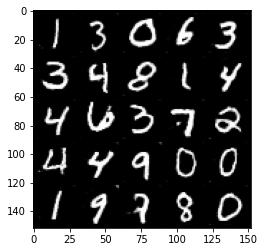

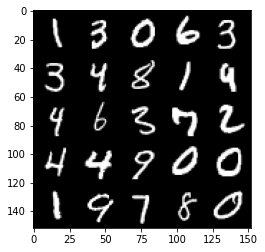

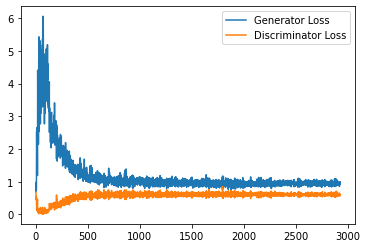

Step 59000: Generator loss: 0.943299418091774, discriminator loss: 0.608379834473133


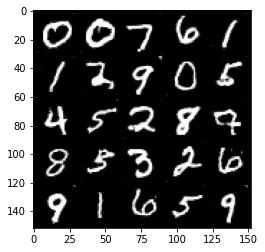

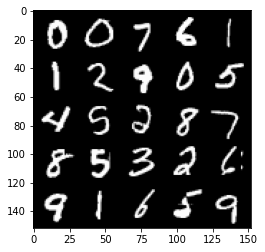

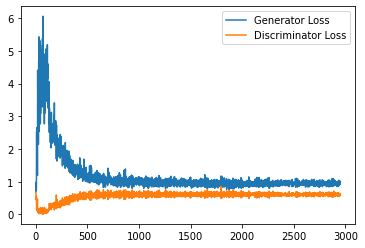

Step 59500: Generator loss: 0.953224870800972, discriminator loss: 0.6080125762224198


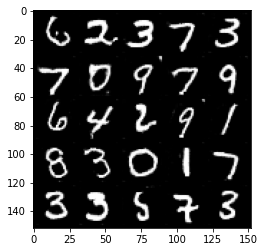

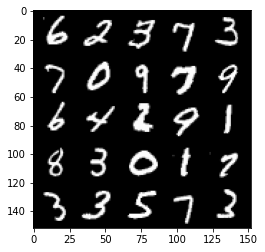

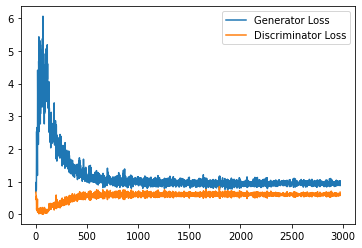

Step 60000: Generator loss: 0.9604383962154388, discriminator loss: 0.6041607784032822


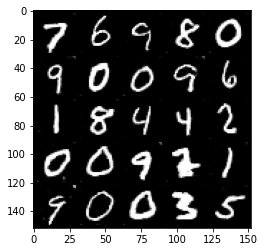

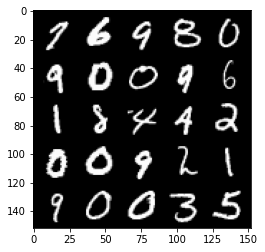

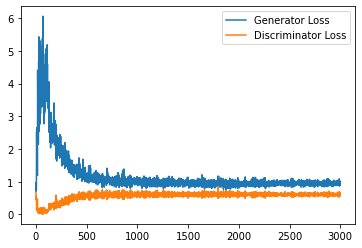

Step 60500: Generator loss: 0.9514423564672471, discriminator loss: 0.6086573504209518


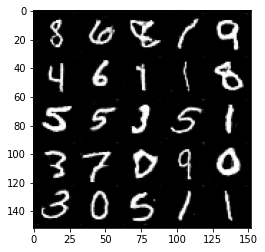

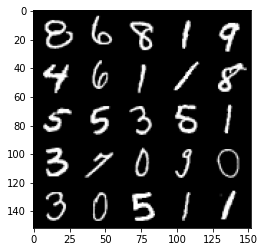

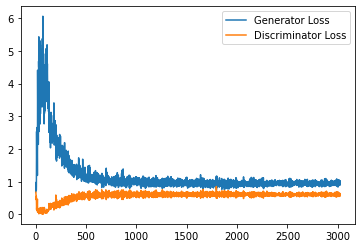

Step 61000: Generator loss: 0.9624614579677582, discriminator loss: 0.6093155885338783


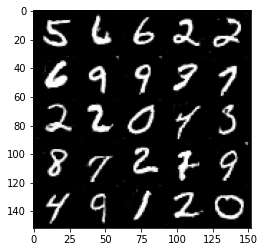

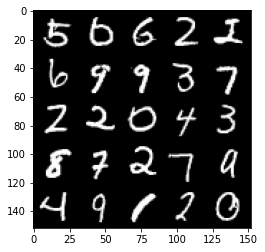

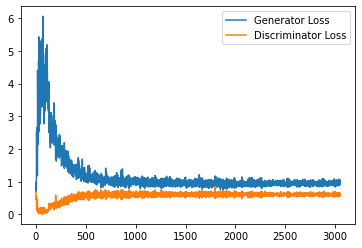

Step 61500: Generator loss: 0.9587412830591202, discriminator loss: 0.6083662728071213


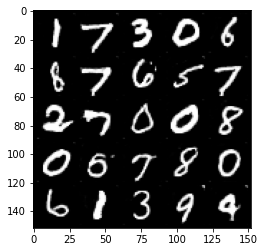

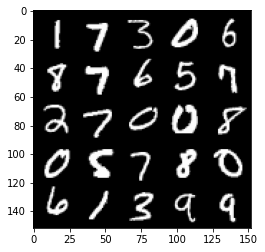

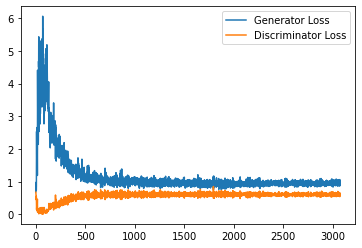

Step 62000: Generator loss: 0.952238861322403, discriminator loss: 0.6061178089976311


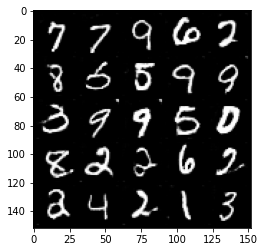

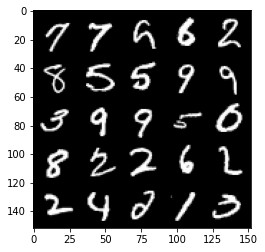

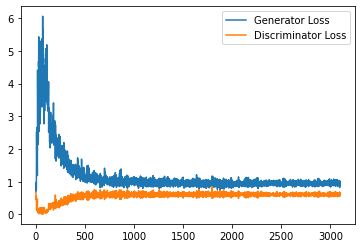

Step 62500: Generator loss: 0.9444889403581619, discriminator loss: 0.6101120707988739


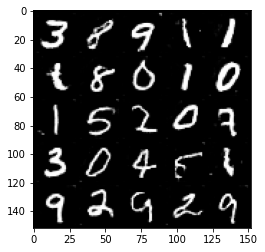

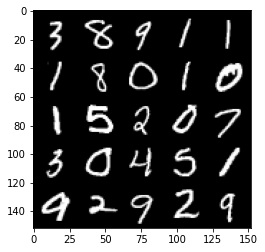

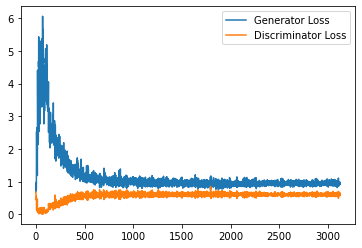

Step 63000: Generator loss: 0.9489707843065261, discriminator loss: 0.6090824137926102


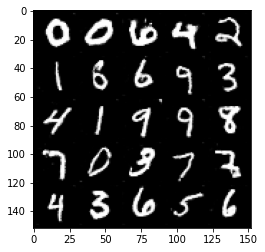

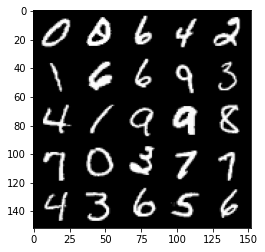

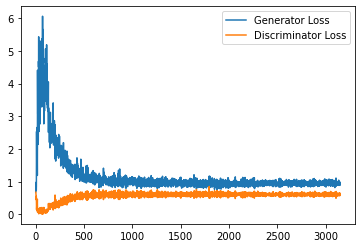

Step 63500: Generator loss: 0.9616978641748428, discriminator loss: 0.6051937517523766


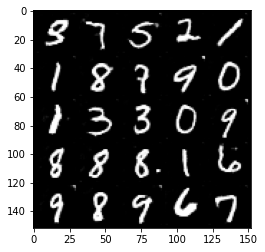

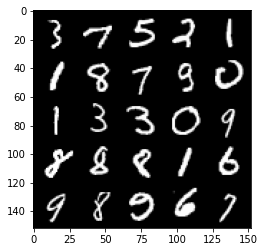

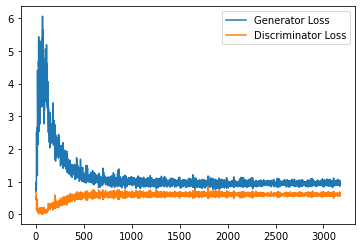

Step 64000: Generator loss: 0.950573254942894, discriminator loss: 0.6076214669346809


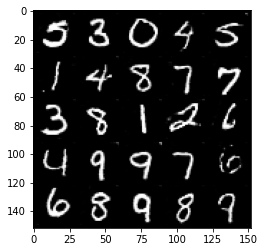

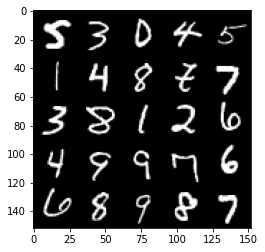

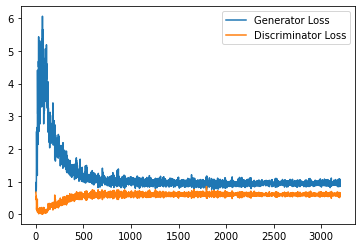

Step 64500: Generator loss: 0.9540890752077102, discriminator loss: 0.6065215485692024


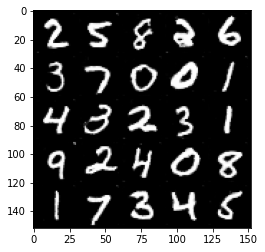

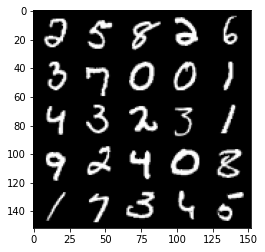

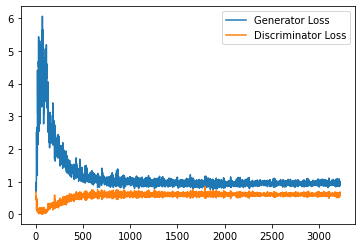

Step 65000: Generator loss: 0.9542157056331635, discriminator loss: 0.6073616706132888


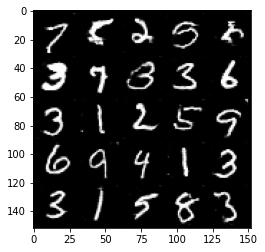

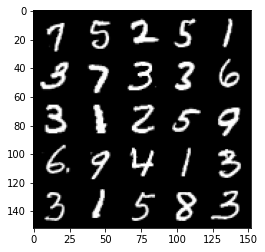

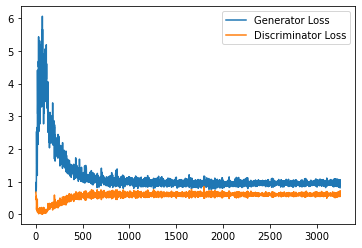

KeyboardInterrupt: 

In [13]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED CELL
cur_step = 0
generator_losses = []
discriminator_losses = []

#UNIT TEST NOTE: Initializations needed for grading
noise_and_labels = False
fake = False

fake_image_and_labels = False
real_image_and_labels = False
disc_fake_pred = False
disc_real_pred = False

for epoch in range(n_epochs):
    # Dataloader returns the batches and the labels
    for real, labels in tqdm(dataloader):
        cur_batch_size = len(real)
        # Flatten the batch of real images from the dataset
        real = real.to(device)

        one_hot_labels = get_one_hot_labels(labels.to(device), n_classes)
        image_one_hot_labels = one_hot_labels[:, :, None, None]
        image_one_hot_labels = image_one_hot_labels.repeat(1, 1, mnist_shape[1], mnist_shape[2])

        ### Update discriminator ###
        # Zero out the discriminator gradients
        disc_opt.zero_grad()
        # Get noise corresponding to the current batch_size 
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        
        # Now you can get the images from the generator
        # Steps: 1) Combine the noise vectors and the one-hot labels for the generator
        #        2) Generate the conditioned fake images
       
        #### START CODE HERE ####
        noise_and_labels = combine_vectors(fake_noise, one_hot_labels)
        fake = gen(noise_and_labels)
        #### END CODE HERE ####
        
        # Make sure that enough images were generated
        assert len(fake) == len(real)
        # Check that correct tensors were combined
        assert tuple(noise_and_labels.shape) == (cur_batch_size, fake_noise.shape[1] + one_hot_labels.shape[1])
        # It comes from the correct generator
        assert tuple(fake.shape) == (len(real), 1, 28, 28)

        # Now you can get the predictions from the discriminator
        # Steps: 1) Create the input for the discriminator
        #           a) Combine the fake images with image_one_hot_labels, 
        #              remember to detach the generator (.detach()) so you do not backpropagate through it
        #           b) Combine the real images with image_one_hot_labels
        #        2) Get the discriminator's prediction on the fakes as disc_fake_pred
        #        3) Get the discriminator's prediction on the reals as disc_real_pred
        
        #### START CODE HERE ####
        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels)
        real_image_and_labels = combine_vectors(real, image_one_hot_labels)
        disc_fake_pred = disc(fake_image_and_labels.detach())
        disc_real_pred = disc(real_image_and_labels)
        #### END CODE HERE ####
        
        # Make sure shapes are correct 
        assert tuple(fake_image_and_labels.shape) == (len(real), fake.detach().shape[1] + image_one_hot_labels.shape[1], 28 ,28)
        assert tuple(real_image_and_labels.shape) == (len(real), real.shape[1] + image_one_hot_labels.shape[1], 28 ,28)
        # Make sure that enough predictions were made
        assert len(disc_real_pred) == len(real)
        # Make sure that the inputs are different
        assert torch.any(fake_image_and_labels != real_image_and_labels)
        # Shapes must match
        assert tuple(fake_image_and_labels.shape) == tuple(real_image_and_labels.shape)
        assert tuple(disc_fake_pred.shape) == tuple(disc_real_pred.shape)
        
        
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        disc_loss.backward(retain_graph=True)
        disc_opt.step() 

        # Keep track of the average discriminator loss
        discriminator_losses += [disc_loss.item()]

        ### Update generator ###
        # Zero out the generator gradients
        gen_opt.zero_grad()

        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels)
        # This will error if you didn't concatenate your labels to your image correctly
        disc_fake_pred = disc(fake_image_and_labels)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the generator losses
        generator_losses += [gen_loss.item()]
        #

        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            disc_mean = sum(discriminator_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, discriminator loss: {disc_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            x_axis = sorted([i * step_bins for i in range(len(generator_losses) // step_bins)] * step_bins)
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(discriminator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Discriminator Loss"
            )
            plt.legend()
            plt.show()
        elif cur_step == 0:
            print("Congratulations! If you've gotten here, it's working. Please let this train until you're happy with how the generated numbers look, and then go on to the exploration!")
        cur_step += 1

## Exploration
You can do a bit of exploration now!

In [14]:
# Before you explore, you should put the generator
# in eval mode, both in general and so that batch norm
# doesn't cause you issues and is using its eval statistics
gen = gen.eval()

#### Changing the Class Vector
You can generate some numbers with your new model! You can add interpolation as well to make it more interesting.

So starting from a image, you will produce intermediate images that look more and more like the ending image until you get to the final image. Your're basically morphing one image into another. You can choose what these two images will be using your conditional GAN.

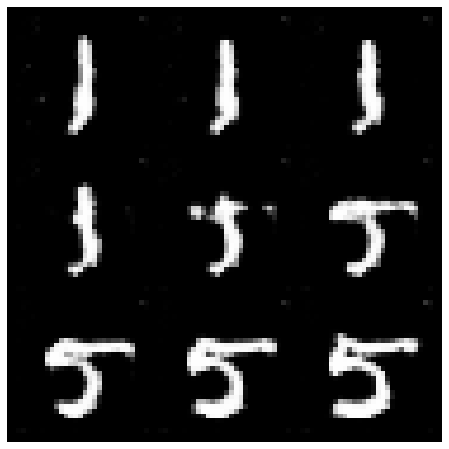

In [15]:
import math

### Change me! ###
n_interpolation = 9 # Choose the interpolation: how many intermediate images you want + 2 (for the start and end image)
interpolation_noise = get_noise(1, z_dim, device=device).repeat(n_interpolation, 1)

def interpolate_class(first_number, second_number):
    first_label = get_one_hot_labels(torch.Tensor([first_number]).long(), n_classes)
    second_label = get_one_hot_labels(torch.Tensor([second_number]).long(), n_classes)

    # Calculate the interpolation vector between the two labels
    percent_second_label = torch.linspace(0, 1, n_interpolation)[:, None]
    interpolation_labels = first_label * (1 - percent_second_label) + second_label * percent_second_label

    # Combine the noise and the labels
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_labels.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation, nrow=int(math.sqrt(n_interpolation)), show=False)

### Change me! ###
start_plot_number = 1 # Choose the start digit
### Change me! ###
end_plot_number = 5 # Choose the end digit

plt.figure(figsize=(8, 8))
interpolate_class(start_plot_number, end_plot_number)
_ = plt.axis('off')

### Uncomment the following lines of code if you would like to visualize a set of pairwise class 
### interpolations for a collection of different numbers, all in a single grid of interpolations.
### You'll also see another visualization like this in the next code block!
# plot_numbers = [2, 3, 4, 5, 7]
# n_numbers = len(plot_numbers)
# plt.figure(figsize=(8, 8))
# for i, first_plot_number in enumerate(plot_numbers):
#     for j, second_plot_number in enumerate(plot_numbers):
#         plt.subplot(n_numbers, n_numbers, i * n_numbers + j + 1)
#         interpolate_class(first_plot_number, second_plot_number)
#         plt.axis('off')
# plt.subplots_adjust(top=1, bottom=0, left=0, right=1, hspace=0.1, wspace=0)
# plt.show()
# plt.close()

#### Changing the Noise Vector
Now, what happens if you hold the class constant, but instead you change the noise vector? You can also interpolate the noise vector and generate an image at each step.

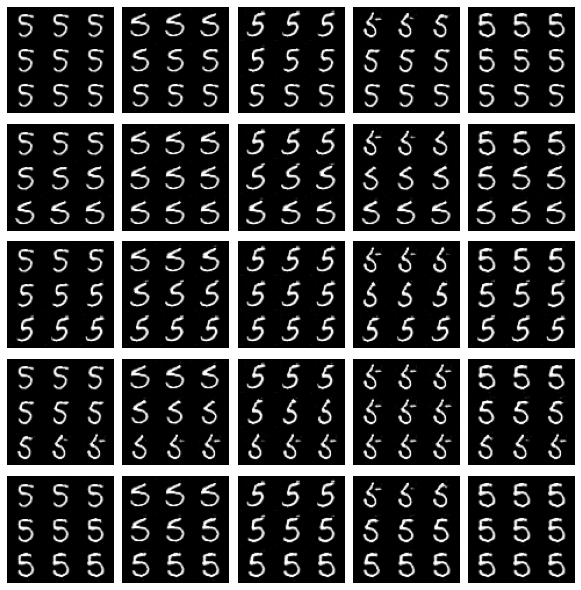

In [16]:
n_interpolation = 9 # How many intermediate images you want + 2 (for the start and end image)

# This time you're interpolating between the noise instead of the labels
interpolation_label = get_one_hot_labels(torch.Tensor([5]).long(), n_classes).repeat(n_interpolation, 1).float()

def interpolate_noise(first_noise, second_noise):
    # This time you're interpolating between the noise instead of the labels
    percent_first_noise = torch.linspace(0, 1, n_interpolation)[:, None].to(device)
    interpolation_noise = first_noise * percent_first_noise + second_noise * (1 - percent_first_noise)

    # Combine the noise and the labels again
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_label.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation, nrow=int(math.sqrt(n_interpolation)), show=False)

# Generate noise vectors to interpolate between
### Change me! ###
n_noise = 5 # Choose the number of noise examples in the grid
plot_noises = [get_noise(1, z_dim, device=device) for i in range(n_noise)]
plt.figure(figsize=(8, 8))
for i, first_plot_noise in enumerate(plot_noises):
    for j, second_plot_noise in enumerate(plot_noises):
        plt.subplot(n_noise, n_noise, i * n_noise + j + 1)
        interpolate_noise(first_plot_noise, second_plot_noise)
        plt.axis('off')
plt.subplots_adjust(top=1, bottom=0, left=0, right=1, hspace=0.1, wspace=0)
plt.show()
plt.close()